In [1]:
from sklearn import metrics
from sklearn.cluster import OPTICS
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import hdbscan
import pandas as pd
import numpy as np
import pylab as py
import matplotlib.pyplot as plt
import glob

from matplotlib.cm import get_cmap
import matplotlib
# for condense trees in hdbscan
import seaborn as sns

%matplotlib inline

#R python libraries to compute cdbw
from rpy2.robjects import r, pandas2ri
from rpy2.robjects.packages import importr
import rpy2.robjects as ro
pandas2ri.activate()
fpc = importr('fpc')

/opt/cloudera/parcels/Anaconda/lib/python3.6/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)
/opt/cloudera/parcels/Anaconda/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [2]:
features_standard_scaled_104_loc = 'darknet_features_201901_06_standard_scaled_104.csv'
features_loc = 'darknet_features_201901_06.csv'

features_pd_standard_scaled_104 = pd.read_csv(features_standard_scaled_104_loc, index_col=False)
features_pd_standard_scaled_104.drop(columns=['file_name'],inplace=True)
features_pd = pd.read_csv(features_loc, index_col=False)
features_pd.drop(columns=['file_name'],inplace=True)

# R studio packages

First we want to have an idea what are the clustering performance evaluation metrics results for clusters extracted from MAWIlab anomaly detection.
We will compute DBCV (Density Based Clustering Validation) and CDbw (Composed Density between and within clusters) for ground truth.

To compute DBCV we will need hdbscan library for python and fpc library for R that contains cdbw algorithm. We will use rpy2 wrapper to use R in python.

Install R software (Rstudio can be run as server, looks like Spyder from Conda environment):
https://cran.ism.ac.jp/

    sudo add-apt-repository 'deb https://cloud.r-project.org/bin/linux/ubuntu trusty-cran35/'
    
    sudo apt-get install r-base
    R --version

run R and install fpc(possibly 'lattice' - not sure why needed) library:
    
    install.packages("fpc")
    install.packages("lattice")

install hdbscan library for python:

    conda install -c conda-forge hdbscan

hdbscan requires sklearn.metics.pairwise_distances_chunked which seems to be not available in default 0.19.2. scikit version of the current Anaconda version available for Cloudera

    sudo conda install scikit-learn=0.21.2

install R wrapper for python:

    conda install -c r rpy2
    
#### Note:
Sometimes there is an old version of R and it outputs errors like this:
    
    dpkg: dependency problems prevent configuration of r-base:
     r-base depends on r-base-core (>= 3.6.1-1trusty); however:
      Package r-base-core is not configured yet.
in thaht case this helps:

     sudo cp /etc/bash_completion.d/R /usr/share/bash-completion/completions/R
     sudo apt-get -f install

# Section 2. DBSCAN

## Section 2.1. KNN Epsilon estimation for DBSCAN

In [10]:
# rule of thumb 1 - minpts >=2*D ; number_of_neighbors = minpts-1 -> 2*D-1
n_nbrs1 = 2*len(features_pd_standard_scaled_105.columns.values) - 1
nbrs1 = NearestNeighbors(n_neighbors=n_nbrs1).fit(features_pd_standard_scaled_105.values)
distances1, indices1 = nbrs1.kneighbors(features_pd_standard_scaled_105.values)
# rule of thumb 2 : minpts >= D+1 ; number_of_neighbors = minpts-1 -> D
n_nbrs2 = len(features_pd_standard_scaled_105.columns.values)
nbrs2 = NearestNeighbors(n_neighbors=n_nbrs2).fit(features_pd_standard_scaled_105.values)
distances2, indices2 = nbrs2.kneighbors(features_pd_standard_scaled_105.values)

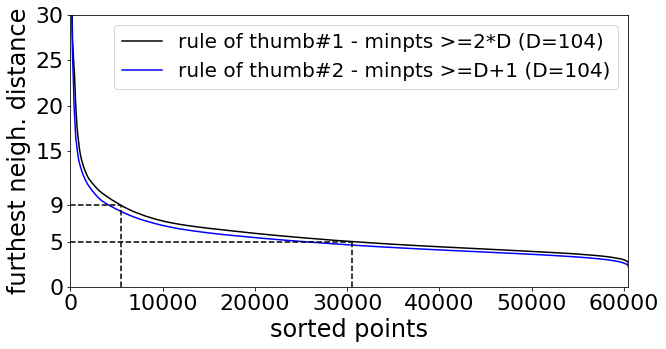

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.plot(np.sort(distances1[:,n_nbrs1-1])[::-1], color='black')
ax.plot(np.sort(distances2[:,n_nbrs2-1])[::-1], color='blue')
ax.set_xlim([0,len(features_pd_standard_scaled_105)])
ax.set_ylim([0,30])

arr = np.sort(distances1[:,n_nbrs1-1])[::-1]
v_low = 5
v_high = 9
idx_low = (np.abs(arr - v_low)).argmin()
idx_high = (np.abs(arr - v_high)).argmin()

ax.axhline(y=v_low, xmin=0, xmax=idx_low/len(arr),linestyle='--',color='black')
ax.axhline(y=v_high, xmin=0, xmax=idx_high/len(arr),linestyle='--',color='black')
ax.axvline(x=idx_low, ymin=0, ymax=v_low/30,linestyle='--',color='black')
ax.axvline(x=idx_high, ymin=0, ymax=v_high/30,linestyle='--',color='black')

ax.set_yticks(list(ax.get_yticks())[3:] + [0,5,9])
#ax.set_xticks([0,5000,10000,15000,22497])
#ax.set_xticklabels(['0','5000','10000','15000','22500'])
ax.tick_params(labelsize=22)
ax.set_xlabel('sorted points',size=24)
ax.set_ylabel('furthest neigh. distance',size=24)

ax.legend(['rule of thumb#1 - minpts >=2*D (D=' + str(len(features_pd_standard_scaled_105.columns)) + ')'\
           ,'rule of thumb#2 - minpts >=D+1 (D=' + str(len(features_pd_standard_scaled_105.columns)) + ')'], fontsize=20)
fig.savefig('plots/k-dist_plots.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [12]:
print('Rule of thumb#1 50th percentile: ' +str(np.percentile(distances1[:,n_nbrs1-1],50)))
print('Rule of thumb#1 90th percentile: ' +str(np.percentile(distances1[:,n_nbrs1-1],90)))

Rule of thumb#1 50th percentile: 5.016837470975597
Rule of thumb#1 90th percentile: 8.687892488998294


## Section 2.1. Clustering

In [18]:
labels_list = list()
min_samples_list = [105, 208]
eps_list = [5, 5.1, 5.2, 5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6, 6.1, 6.2, 6.3, 6.4, 6.5, 6.6, 6.7, 6.8, 6.9, 7, 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8, 7.9, 8, 8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9]

for min_samples in min_samples_list:
    for eps in eps_list:
        print(eps)
        dbscan_clust = DBSCAN(eps=eps, min_samples=min_samples).fit(features_pd_standard_scaled_104.values)
        labels_list.append(dbscan_clust.labels_)

In [16]:
min_samples_list_df = [min_samples_list[0] for i in range(len(eps_list))]
min_samples_list_df.extend([min_samples_list[1] for i in range(len(eps_list))])
eps_list.extend(eps_list)
dbscan_results = {'min_samples' : min_samples_list_df,
                       'eps' : eps_list,
                       'labels' : labels_list}
dbscan_results_df = pd.DataFrame(mawi_dbscan_results)
eps_list = [5, 5.1, 5.2, 5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6, 6.1, 6.2, 6.3, 6.4, 6.5, 6.6, 6.7, 6.8, 6.9, 7, 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8, 7.9, 8, 8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9]

In [17]:
dbscan_results_df.to_pickle('darknet104_dbscan_results_df.csv')
#dbscan_results_df = pd.read_pickle('darknet104_dbscan_results_df.csv')

## Section 2.2. V-measure, DBCV, CDbW

In [4]:
cdbw_list = list()
cohesion_list = list()
compactness_list = list()
sep_list = list()
dbcv_list = list()

noise_index_list = list()
clusters_index_list = list()
clusters_labels_list = list()

for labels,i in zip(dbscan_results_df['labels'],range(len(dbscan_results_df['labels']))):
    print(i)
    noise_index = np.where(labels==-1)[0]
    noise_index_list.append(noise_index)
    clusters_index = np.where(labels!=-1)[0]
    clusters_index_list.append(clusters_index)
    clusters_labels = labels[clusters_index]
    clusters_labels_list.append(clusters_labels)

    if len(np.unique(clusters_labels)) > 1 :
    # cluster_vector+1 -> as R uses numbering starting with 1 and not 0 as python,
        anomaly_cdbw = fpc.cdbw(features_pd_standard_scaled_104.values[clusters_index], clusters_labels+1,r=10)
        cdbw_list.append(anomaly_cdbw[0][0])
        cohesion_list.append(anomaly_cdbw[1][0])
        compactness_list.append(anomaly_cdbw[2][0])
        sep_list.append(anomaly_cdbw[3][0])
        dbcv_list.append(hdbscan.validity_index(features_pd_standard_scaled_104.values[clusters_index], clusters_labels))
    else:
        cdbw_list.append('NA')
        cohesion_list.append('NA')
        compactness_list.append('NA')
        sep_list.append('NA')
        dbcv_list.append('NA')

dbscan_results_df['Composed Density between and within clusters(cdbw)'] = cdbw_list
dbscan_results_df['Composed Density between and within clusters(cohesion)'] = cohesion_list
dbscan_results_df['Composed Density between and within clusters(compactness)'] = compactness_list
dbscan_results_df['Composed Density between and within clusters(sep)'] = sep_list
dbscan_results_df['Density Based Clustering Validation(dbcv)'] = dbcv_list
dbscan_results_df['noise_index'] = noise_index_list
dbscan_results_df['clusters_index'] = clusters_index_list
dbscan_results_df['clusters_labels'] = clusters_labels_list

dbscan_results_df.to_pickle('darknet106_dbscan_results_df_eval.csv')

In [5]:
dbscan_results_df = pd.read_pickle('results/darknet104_dbscan_results_df_eval.csv')

# some clustering results contained only 1 cluster - it does not make sense to evaluate clustering of 1 cluster
dbscan_results_df['Composed Density between and within clusters(cdbw)'].replace('NA',0,inplace=True)
dbscan_results_df['Composed Density between and within clusters(cohesion)'].replace('NA',0,inplace=True)
dbscan_results_df['Composed Density between and within clusters(compactness)'].replace('NA',0,inplace=True)
dbscan_results_df['Composed Density between and within clusters(sep)'].replace('NA',0,inplace=True)
dbscan_results_df['Density Based Clustering Validation(dbcv)'].replace('NA',-1,inplace=True)
dbscan_results_df.set_index(['eps'], inplace= True)

Max DBCV for MinPts=208 (eps/value) :6.5/-0.1123762965488091
Max DBCV for MinPts=105 (eps/value) :6.1/-0.06639746879890478


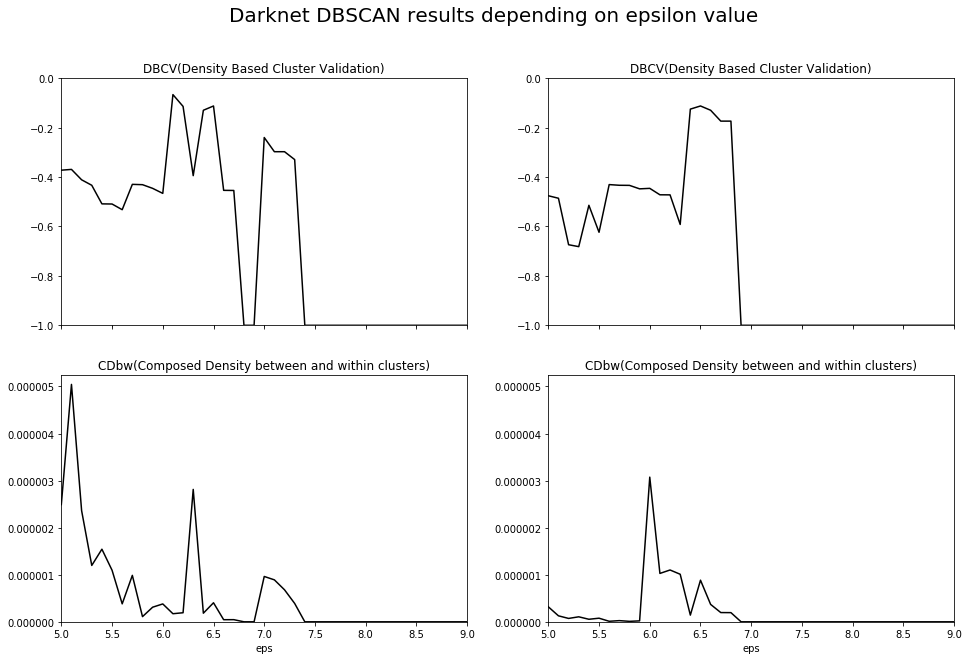

In [22]:
fig, ax = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle('Darknet DBSCAN results depending on epsilon value', size=20)
# clustering results for too low or too high values of Eps result in 1 cluster or noise and DBCV is 'NaN'; min value for DBCV is -1 -> replace('NaN', -1)
dbscan_results_df[dbscan_results_df['min_samples']==105]['Density Based Clustering Validation(dbcv)'].plot(kind='line',ax=ax[0,0],sharex=True,title='DBCV(Density Based Cluster Validation)',ylim=[-1,0],color='black')
dbscan_results_df[dbscan_results_df['min_samples']==105]['Composed Density between and within clusters(cdbw)'].plot(kind='line',ax=ax[1,0],sharex=True,title='CDbw(Composed Density between and within clusters)',ylim=[0,0.00000525],color='black')

dbscan_results_df[dbscan_results_df['min_samples']==208]['Density Based Clustering Validation(dbcv)'].plot(kind='line',ax=ax[0,1],sharex=True,title='DBCV(Density Based Cluster Validation)',ylim=[-1,0],color='black')
# ax[2,1].axvline(x=5.9, ymin=0, ymax=(0.6+0.6972385369957197)/1.4,linestyle='--',color='black')
# ax[2,1].axhline(y=0.6972385369957197, xmin=0, xmax=0.9/3,linestyle='--',color='black')
# ax[2,1].set_yticks(list(ax[2,1].get_yticks()) + [0.6972385369957197])
# ax[2,0].set_yticklabels(['','-0.500','0.000','0.500'])
# ax[2,1].set_ylim([-0.6,0.8])
dbscan_results_df[dbscan_results_df['min_samples']==208]['Composed Density between and within clusters(cdbw)'].plot(kind='line',ax=ax[1,1],sharex=True,title='CDbw(Composed Density between and within clusters)',ylim=[0,0.00000525],color='black')

print('Max DBCV for MinPts=208 (eps/value) :' + \
str(dbscan_results_df[dbscan_results_df['min_samples']==208]['Density Based Clustering Validation(dbcv)'].idxmax()) \
+'/'+ str(dbscan_results_df[dbscan_results_df['min_samples']==208]['Density Based Clustering Validation(dbcv)'].max()))

print('Max DBCV for MinPts=105 (eps/value) :' + \
str(dbscan_results_df[dbscan_results_df['min_samples']==105]['Density Based Clustering Validation(dbcv)'].idxmax()) \
+'/'+ str(dbscan_results_df[dbscan_results_df['min_samples']==105]['Density Based Clustering Validation(dbcv)'].max()))

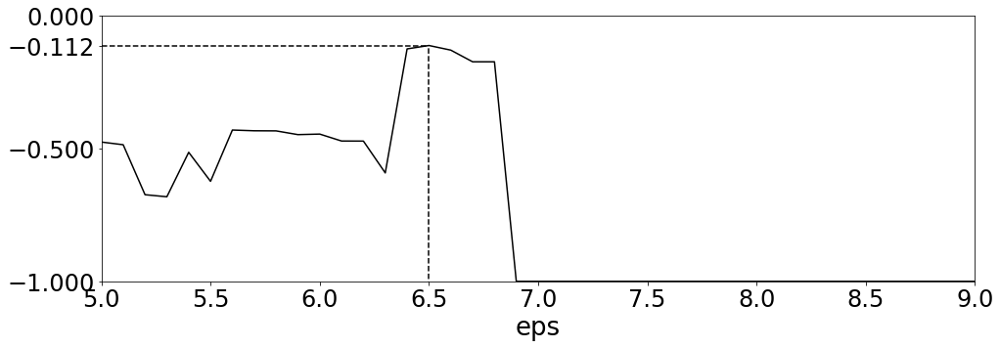

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(16, 5))
ax.xaxis.label.set_size(26)
ax.tick_params(labelsize=24)
import matplotlib.ticker as mtick

# clustering results for too low or too high values of Eps result in 1 cluster or noise and DBCV is 'NaN'; min value for DBCV is -1 -> replace('NaN', -1)

# dbscan_results_df[dbscan_results_df['min_samples']==105]['Density Based Clustering Validation(dbcv)'].plot(kind='line',ax=ax,sharex=True,ylim=[-1,0],color='black')
# fig.savefig('plots/darknet104_dbcv_minpts105.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

# dbscan_results_df[dbscan_results_df['min_samples']==105]['Composed Density between and within clusters(cdbw)'].plot(kind='line',ax=ax,sharex=True,ylim=[0,0.00000525],color='black')
# ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.e'))
# fig.savefig('plots/darknet104_cdbw_minpts105.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)


dbscan_results_df[dbscan_results_df['min_samples']==208]['Density Based Clustering Validation(dbcv)'].plot(kind='line',ax=ax,sharex=True,ylim=[-0.6,0.8],color='black')
ax.axvline(x=6.5, ymin=-1, ymax=(1-0.1123762965488091)/1.,linestyle='--',color='black')
ax.axhline(y=-0.1123762965488091, xmin=0, xmax=1.5/4,linestyle='--',color='black')
ax.set_yticks(list(ax.get_yticks()) + [-0.1123762965488091])
ax.set_ylim([-1,0])
fig.savefig('plots/darknet104_dbcv_minpts208.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

# dbscan_results_df[dbscan_results_df['min_samples']==208]['Composed Density between and within clusters(cdbw)'].plot(kind='line',ax=ax,sharex=True,ylim=[0,0.00000525],color='black')
# ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.e'))
# fig.savefig('plots/darknet104_cdbw_minpts208.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

## Section 2.3. Cluster sizes

IMPORTANT NOTE: Whisker(end points of boxplots) show min/max values. By default whiskers show (Q3 + whis*IQR) and Q1 - whis*IQR. Beyond the whiskers, data are considered outliers and are drawn by default - we willturn it off to make the boxplots easier to read.

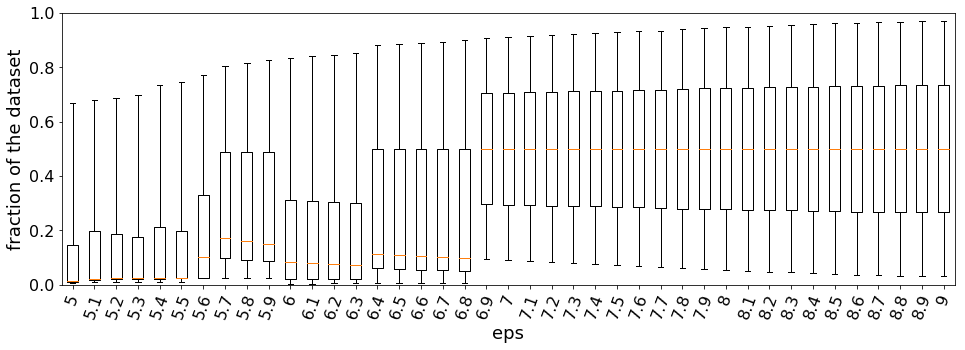

In [28]:
fig, ax = plt.subplots(1, 1, figsize=(16, 5))
eps_list = [5, 5.1, 5.2, 5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6, 6.1, 6.2, 6.3, 6.4, 6.5, 6.6, 6.7, 6.8, 6.9, 7, 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8, 7.9, 8, 8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9]
dataset = features_pd_standard_scaled_104.copy()

boxplot_data = list()
for eps in eps_list:
    boxplot_data.append(np.unique(dbscan_results_df['labels'][dbscan_results_df['min_samples']==208][eps],return_counts=True)[1]/len(dataset))
ax.boxplot(boxplot_data, whis='range', showfliers=False)    
ax.set_ylim(0,1)
ax.set_xticklabels(eps_list,rotation=70)
#ax.set_xlim(20.5,69.5)
ax.set_ylabel('fraction of the dataset')
ax.set_xlabel("eps")
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
#ax.set_title("MAWI DBSCAN clusters sizes depending on Eps(minPts = 202)")
fig.savefig('plots/darknet104_dbscan_cluster_size_minpts208.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)
#plt.subplots_adjust(hspace = 0.35)

## Section 2.4. Outliers

DBSCAN classifies everything outsiede of the Epsilon neighborhood boundaries as Noise. Another way to itnerpret Noise is Outliers. We will analyse Oulier magnitude and consistency of sets of samples marked as outliers by Jaccard index.

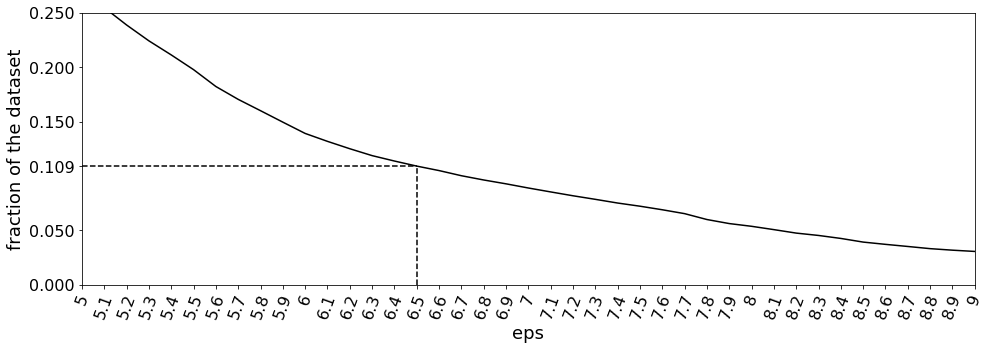

In [31]:
fig, ax = plt.subplots(1, 1, figsize=(16, 5))

plot_data = list()
for eps in eps_list:
    plot_data.append(len(dbscan_results_df['noise_index'][dbscan_results_df['min_samples']==208][eps])/len(dataset))
ax.plot(plot_data,color='black')    
ax.set_ylim(0,1)
ax.set_xticks(np.arange(len(eps_list)))
ax.set_xticklabels(eps_list,rotation=70)
ax.set_ylim(0,0.25)
ax.set_xlim(0,40)
ax.set_ylabel('fraction of the dataset')
ax.set_xlabel("eps")
ax.axvline(x=15, ymin=0, ymax=plot_data[15]/0.25,linestyle='--',color='black')
ax.axhline(y=plot_data[15], xmin=0, xmax=15/40,linestyle='--',color='black')
ax.set_yticks(list(ax.get_yticks())[3:] + [0,0.050,plot_data[15]])

ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
#ax[1].set_title("Darknet DBSCAN noise/outlier magnitude depending on Eps(minPts = 202)")
fig.savefig('plots/darknet104_outlier_magnitude_minpts208.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)
#plt.subplots_adjust(hspace = 0.35)

## Section 2.5. DBSCAN clusters continuity + sizes

In [27]:
unique_clusters, counts = np.unique(dbscan_results_df['labels'][dbscan_results_df['min_samples']==208][6.5],return_counts=True)
counts = counts/float(len(features_pd_standard_scaled_104))

print('Cluster counts DBSCAN, minpts=208, eps=6.5 :')
for label,count in zip(unique_clusters,counts):
    print('Cluster ' + str(label) + ' size : ' + str(count))

Cluster counts DBSCAN, minpts=208, eps=6.5 :
Cluster -1 size : 0.108985066234475
Cluster 0 size : 0.885491259695371
Cluster 1 size : 0.005523674070153969


Cluster min/max -1: 1.6537946317826253e-05/9.922767790695752e-05
0.009922767790695751
Cluster min/max 0: 1.6537946317826253e-05/0.0015876428465113202
0.15876428465113201
Cluster min/max 1: 1.6537946317826253e-05/3.3075892635652505e-05
0.0033075892635652505


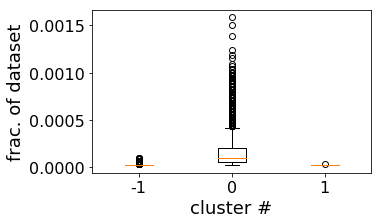

In [40]:
dataset = dbscan_results_df['labels'][dbscan_results_df['min_samples']==208][6.5].copy()
continuity_boxplot_list = list()
for uq_cl in unique_clusters:
    continuity_boxplot_temp = list()
    temp = 0
    for i in range(len(dataset)):
        if dataset[i]==uq_cl:
            temp+=1
        if dataset[i]!=uq_cl and temp>0:
            continuity_boxplot_temp.append(temp/len(dataset))
            temp = 0
    continuity_boxplot_list.append(continuity_boxplot_temp)

fig, ax = plt.subplots(1, 1, figsize=(5, 3))

boxplot_data = continuity_boxplot_list
ax.boxplot(boxplot_data)#, whis='range',showfliers=True)
ax.set_xticklabels(unique_clusters)
ax.set_ylabel('frac. of dataset')
ax.set_xlabel('cluster #')
#ax.set_title('Darknet DBSCAN cluster continuity')
for i,cl in zip(boxplot_data,unique_clusters):
    print('Cluster min/max ' +str(cl)+ ': ' +str(min(i))+ '/' +str(max(i)))
    print(str(max(i)*100))
#ax.set_ylim([0,0.002])
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
fig.savefig('plots/darknet_dbscan_clusters_continuity.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

## Section 2.6. DBSCAN interpretation by feature values

In [6]:
#mawi:
#reordered_columns_orig = ['vol(frame_len)', 'avg(frame_len)', 'avg(tcp_len)', 'avg(tcp_winsize)', 'avg(ip_len)', 'entropy(frame_len)', 'entropy(tcp_len)', 'entropy(tcp_winsize)','entropy(ip_len)','var(frame_len)', 'var(tcp_len)', 'var(tcp_winsize)', 'var(ip_len)','stddev(frame_len)', 'stddev(tcp_len)','stddev(tcp_winsize)', 'stddev(ip_len)', 'p50(frame_len)', 'p75(frame_len)', 'p50(ip_len)', 'p75(ip_len)','p50(tcp_len)','p1(tcp_winsize)','p2(tcp_winsize)','p5(tcp_winsize)','p10(tcp_winsize)', 'p15(tcp_winsize)', 'p20(tcp_winsize)', 'p25(tcp_winsize)', 'p50(tcp_winsize)', 'p75(tcp_winsize)', 'p97(tcp_winsize)', 'p99(tcp_winsize)','entropy(tcp_flags)', 'frac_tcpflag(tcp_flags_ack)','frac_tcpflag(tcp_flags_push)', 'frac_tcpflag(tcp_flags_syn)','entropy_1st_ip_octet(ip_dst)','entropy_2nd_ip_octet(ip_dst)', 'entropy_3rd_ip_octet(ip_dst)', 'entropy_4th_ip_octet(ip_dst)','entropy_1st_ip_octet(ip_src)', 'entropy_2nd_ip_octet(ip_src)','entropy_3rd_ip_octet(ip_src)','entropy_4th_ip_octet(ip_src)','frac_tcp(ip_proto)','frac_udp(ip_proto)', 'frac_gre(ip_proto)','frac_icmp(ip_proto)','entropy(icmp_type)','frac_echo_request(icmp_type)', 'frac_echo_reply(icmp_type)', 'frac_ipv4', 'frac_ipv6','frac_well_known(tcp_dstport)','frac_well_known(tcp_srcport)', 'frac_well_known(udp_dstport)','frac_well_known(udp_srcport)','frac_registered_ports(tcp_dstport)','frac_registered_ports(tcp_srcport)','frac_registered_ports(udp_dstport)','frac_registered_ports(udp_srcport)','frac_dynamic_ports(tcp_dstport)','frac_dynamic_ports(tcp_srcport)','frac_dynamic_ports(udp_dstport)','frac_dynamic_ports(udp_srcport)', 'frac_document_retrieval_tcp(tcp_dstport)','frac_document_retrieval_tcp(tcp_srcport)','frac_mail_tcp(tcp_dstport)', 'frac_mail_tcp(tcp_srcport)','frac_networking_udp(udp_dstport)','frac_networking_udp(udp_srcport)','frac_remote_access_tcp(tcp_dstport)','frac_remote_access_tcp(tcp_srcport)']
#darknet:
reordered_columns_orig = ['vol(frame_len)', 'num_pkts(frame_len)', 'avg(frame_len)', 'avg(ip_len)', 'avg(ip_ttl)', 'avg(tcp_winsize)','entropy(frame_len)', 'entropy(ip_len)','entropy(ip_ttl)', 'entropy(tcp_winsize)','p95(frame_len)', 'p97(frame_len)','p99(frame_len)','p95(ip_len)', 'p99(ip_len)', 'p97(ip_len)','p1(ip_ttl)', 'p2(ip_ttl)','p5(ip_ttl)','p10(ip_ttl)','p15(ip_ttl)',  'p20(ip_ttl)', 'p25(ip_ttl)', 'p50(ip_ttl)', 'p75(ip_ttl)','p90(ip_ttl)','p95(ip_ttl)', 'p97(ip_ttl)', 'p99(ip_ttl)','p50(tcp_winsize)','p75(tcp_winsize)','stddev(frame_len)', 'stddev(ip_len)', 'stddev(ip_ttl)','stddev(tcp_winsize)', 'var(frame_len)','var(ip_len)','var(ip_ttl)','var(tcp_winsize)','max(frame_len)','max(ip_len)','min(ip_ttl)','max(ip_ttl)', 'max(tcp_winsize)', 'entropy_1st_IP_octet(ip_src)', 'entropy_2nd_IP_octet(ip_src)','entropy_3rd_IP_octet(ip_src)','entropy_4th_IP_octet(ip_src)','entropy_3rd_IP_octet(ip_dst)','entropy_4th_IP_octet(ip_dst)', 'entropy(icmp_type)', 'frac_destination_unreachable(icmp_type)','frac_echo_request(icmp_type)','num_destination_unreachable(icmp_type)','num_echo_request(icmp_type)','frac_document_retrieval_tcp(tcp_dstport)','frac_document_retrieval_tcp(tcp_srcport)','frac_document_retrieval_udp(udp_dstport)','num_document_retrieval_tcp(tcp_dstport)','num_document_retrieval_tcp(tcp_srcport)','num_document_retrieval_udp(udp_dstport)','frac_dynamic_ports(tcp_dstport)','frac_dynamic_ports(tcp_srcport)','frac_dynamic_ports(udp_dstport)','frac_dynamic_ports(udp_srcport)','num_dynamic_ports(tcp_dstport)', 'num_dynamic_ports(tcp_srcport)','num_dynamic_ports(udp_dstport)', 'num_dynamic_ports(udp_srcport)', 'frac_icmp(ip_proto)', 'frac_tcp(ip_proto)','frac_udp(ip_proto)','num_icmp(ip_proto)','num_tcp(ip_proto)','num_udp(ip_proto)','entropy(tcp_flags)','frac_tcpflag(tcp_flags_ack)', 'frac_tcpflag(tcp_flags_cwr)','frac_tcpflag(tcp_flags_ecn)', 'frac_tcpflag(tcp_flags_syn)', 'num_tcpflag(tcp_flags_ack)','num_tcpflag(tcp_flags_cwr)','num_tcpflag(tcp_flags_ecn)', 'num_tcpflag(tcp_flags_syn)','frac_networking_udp(udp_dstport)','num_networking_udp(udp_dstport)','frac_registered_ports(tcp_dstport)','frac_registered_ports(tcp_srcport)','frac_registered_ports(udp_dstport)','frac_registered_ports(udp_srcport)','num_registered_ports(tcp_dstport)','num_registered_ports(tcp_srcport)','num_registered_ports(udp_dstport)','num_registered_ports(udp_srcport)','frac_remote_access_tcp(tcp_dstport)','num_remote_access_tcp(tcp_dstport)','frac_well_known(tcp_dstport)','frac_well_known(tcp_srcport)', 'frac_well_known(udp_dstport)','frac_well_known(udp_srcport)','num_well_known(tcp_dstport)','num_well_known(tcp_srcport)', 'num_well_known(udp_dstport)','num_well_known(udp_srcport)']
# reverse the list for boxplots
reordered_columns = reordered_columns_orig[::-1]

# define features and groudn truth datasets we will use
dataset = features_pd_standard_scaled_104[reordered_columns].copy()
dataset['label'] = dbscan_results_df['labels'][dbscan_results_df['min_samples']==208][6.5].copy()

# "normal" - largest cluster
largest_cluster = dataset['label'].value_counts()[:1].index[0]    

# mean feature values for each cluster
clusters_interpretation_features = dataset.groupby('label').mean()

#subtract largest cluster features average values from cluster feaures
largest_cluster_features = clusters_interpretation_features.loc[largest_cluster]
clusters_interpretation_features_norm = clusters_interpretation_features.copy()
for index in clusters_interpretation_features.index.values:
    clusters_interpretation_features_norm.loc[index] = clusters_interpretation_features.loc[index].sub(largest_cluster_features)

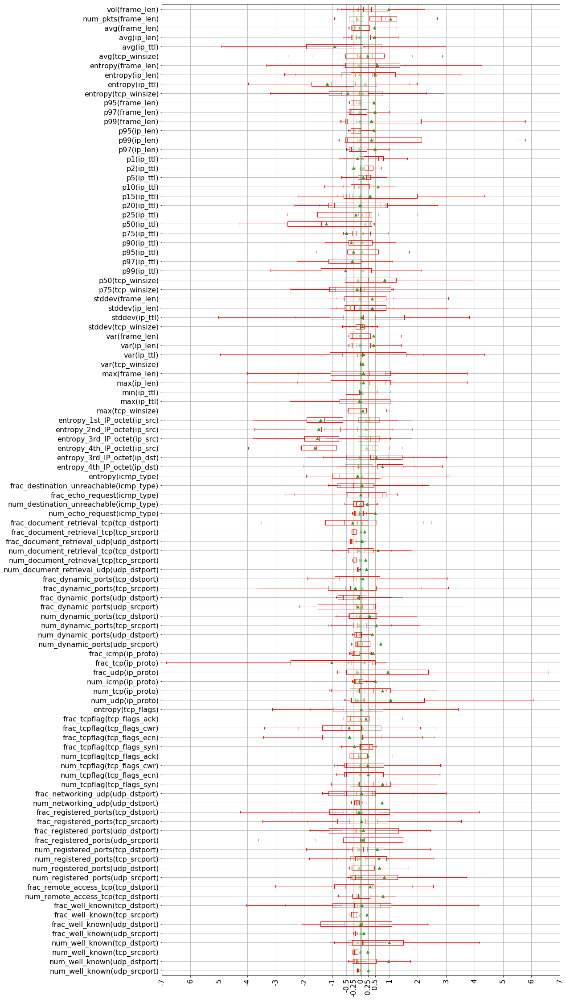

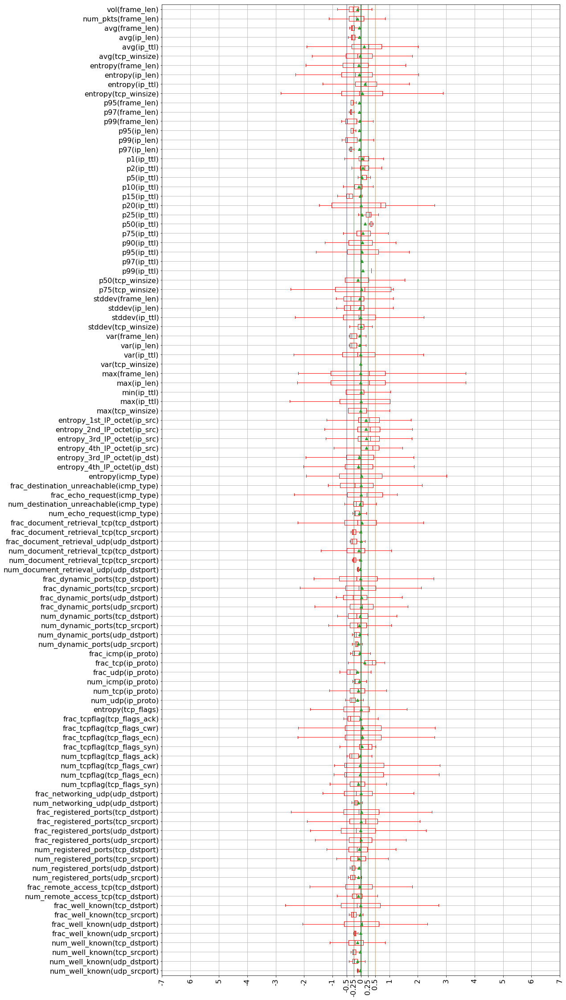

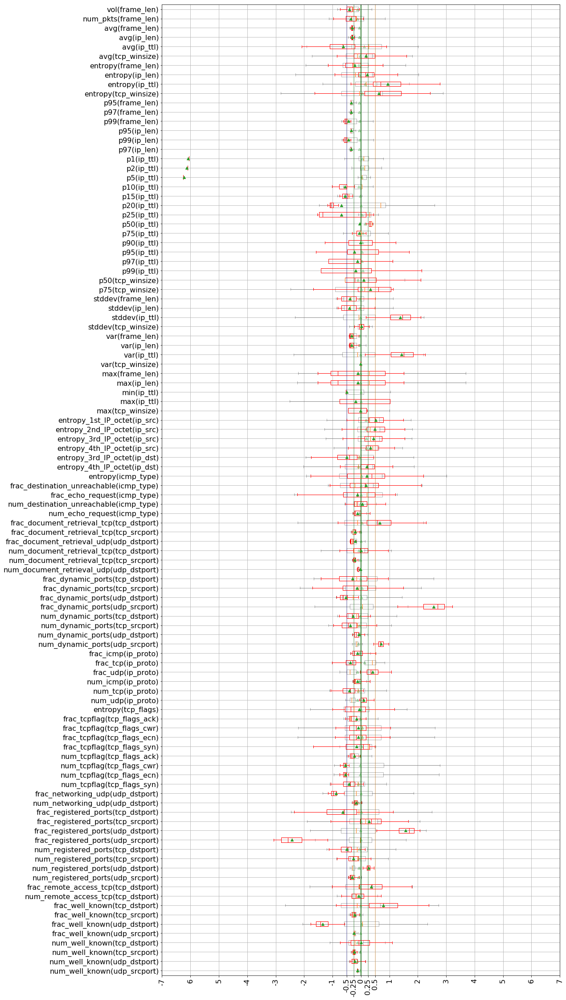

In [8]:
# I used pandas boxplot as its faster, I need less parameters and it puts grid/features names
for i in range(-1,2):
    fig, ax = plt.subplots(1, 1, figsize=(16,40), sharex=True)
    # I use matplotlib boxplot as I couldnt figure out how to make pandas boxplot transparent
    boxplot = ax.boxplot(dataset[dataset['label']==largest_cluster][dataset.columns[:-1]].values, vert=False,showfliers=False,boxprops=dict(alpha=.3),whiskerprops=dict(alpha=.3),capprops=dict(alpha=.3),meanprops=dict(alpha=.3),showmeans=True)
    dataset[dataset['label']==i][dataset.columns[:-1]].plot(fontsize = 16,kind='box',color=dict(boxes='red', whiskers='red', medians='red', caps='red'),vert=False,showfliers=False,ax=ax,grid=True,showmeans=True)
    ax.set_xlim([-7,7])
    ax.set_xticks([-7,-6,-5,-4,-3,-2,-1,-0.5,-0.25,0,0.25,0.5,1,2,3,4,5,6,7])
    ax.set_xticklabels(['-7','6','5','-4','-3','-2','-1','-0.5','-0.25','0','0.25','0.5','1','2','3','4','5','6','7'],rotation=90)
    ax.axvline(0.5, color='darkorange',alpha=.3)
    ax.axvline(0.25, color='green',alpha=.3)
    ax.axvline(-0.5, color='darkblue',alpha=.3)
    ax.axvline(-0.25, color='green',alpha=.3)
    ax.axvline(0, color='darkgreen')
    fig.savefig('plots/darknet104_dbscan208_eps6_5_cluster_'+str(i)+'_feature_interpretation.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [9]:
# .T - table is transposed, we see features in rows
# midpoint of background gradient can't be set to fix values, i.e. 1, it wan be only shifted by custome functions in interval [0,1] for whole table
# axis=1 colormap is applied rowise
# 
clusters_interpretation_features[reordered_columns_orig].T.style.background_gradient(cmap='coolwarm',axis=1)

label,-1,0,1
vol(frame_len),0.968391,-0.116681,-0.401866
num_pkts(frame_len),1.03691,-0.125423,-0.352437
avg(frame_len),0.467293,-0.05555,-0.314798
avg(ip_len),0.478182,-0.0569544,-0.30453
avg(ip_ttl),-0.91974,0.117057,-0.618235
avg(tcp_winsize),0.245075,-0.0312104,0.167831
entropy(frame_len),0.578331,-0.0698025,-0.220861
entropy(ip_len),0.497982,-0.0627049,0.226662
entropy(ip_ttl),-1.18349,0.139747,0.948262
entropy(tcp_winsize),-0.472902,0.054298,0.626187


# Section 3. OPTICS

## Section 3.1. OPTICS computation in scikit v0.21.2

In [7]:
ordered_reachability_list = list()
ordered_labels_list = list()
ordered_core_distances_list = list()

reachability_list = list()
labels_list = list()
core_distances_list = list()

cluster_hierarchy_list = list()
samples_ordering_list = list()
xi_list = [0.0005,0.0006,0.0007,0.0008,0.0009,0.001,0.002,0.003,0.004,0.005,0.006,0.007,0.008,0.009,0.01,0.02]

# min_cluster_size value is used during cluster extraction - ELKI does not support this, with value 10 we get better granularity of smaller clusters
# the idea(I think) is that we calculate DBSCAN by minpts value, take eps=Inf, compute reachability and then extarct clusters
for xi in xi_list:
    print(str(xi))
    optics_clust = OPTICS(min_samples=208, xi=xi, min_cluster_size=10)
    optics_clust.fit(features_pd_standard_scaled_104.values)

    ordered_reachability_list.append(optics_clust.reachability_[optics_clust.ordering_])
    ordered_labels_list.append(optics_clust.labels_[optics_clust.ordering_])
    ordered_core_distances_list.append(optics_clust.core_distances_[optics_clust.ordering_])

    reachability_list.append(optics_clust.reachability_)
    labels_list.append(optics_clust.labels_)
    core_distances_list.append(optics_clust.core_distances_)

    cluster_hierarchy_list.append(optics_clust.cluster_hierarchy_)
    samples_ordering_list.append(optics_clust.ordering_)

# save/load results
optics_results = {'xi' : xi_list,
                       'ordered_samples' : samples_ordering_list,
                       'ordered_reachability' : ordered_reachability_list,
                       'ordered_core_distances' : ordered_core_distances_list,
                       'ordered_clusters_labels' : ordered_labels_list,
                       'reachability' : reachability_list,
                       'core_distances' : core_distances_list,
                       'clusters_labels' : labels_list,
                       'cluster_hierarchy' : cluster_hierarchy_list}
optics_results_df = pd.DataFrame(optics_results)

In [3]:
#optics_results_df.to_pickle('darknet104_optics_ms208_mcl10_results_df_orig.csv')
optics_results_df = pd.read_pickle('darknet104_optics_ms208_mcl10_results_df_orig.csv')

## Section 3.2. scikit v0.21.2 OPTICS results adjustments

Labels are not correctly assigned to OPTICS results in v0.21.2. but the hierarchy is same as in ELKI and I dedicded to  adjust scikit results as it's easiet to add new columns and recompute values than rerun ELKI.

In [4]:
# ordering is same for every result, only hierarchy -> ordered_clusters_labels and clusters_labels are different
ordered_labels_list = list()
for clusters_hierarchy in optics_results_df['cluster_hierarchy']:
    temp_labels = np.zeros(len(features_pd_standard_scaled_104))
    for cluster,i in zip(clusters_hierarchy[::-1],range(-1,len(clusters_hierarchy)-1)):
        temp_labels[cluster[0]:cluster[1]] = i
    ordered_labels_list.append(temp_labels.astype(int))    
optics_results_df['ordered_clusters_labels'] = ordered_labels_list

In [12]:
#optics_results_df.to_pickle('darknet104_optics_ms208_mcl10_results_df.csv')
optics_results_df = pd.read_pickle('results/darknet104_optics_ms208_mcl10_results_df.csv')

## Section 3.3. Visualization of OPTICS results - reachability plots

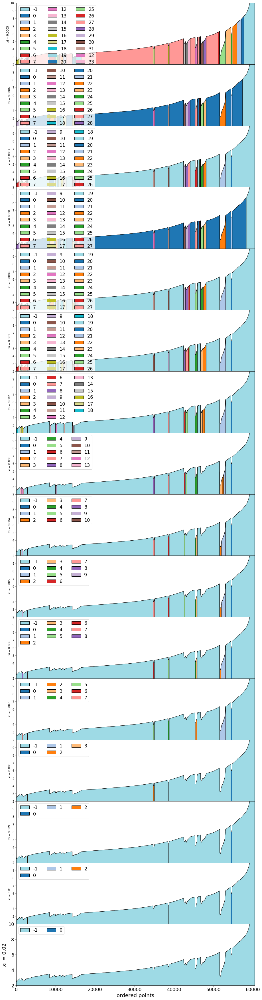

In [9]:
# list of colormapshttps://matplotlib.org/3.1.1/tutorials/colors/colormaps.html
import matplotlib.patches as mpatches
cmap = get_cmap('tab20')  # type: matplotlib.colors.ListedColormap
colors = cmap.colors  # type: list

fig, ax = plt.subplots(len(optics_results_df['xi']), 1, figsize=(15,60) , sharex=True)

for j in range(len(optics_results_df['xi'])):
    ax[j].plot(optics_results_df['ordered_reachability'][j],color='black',linewidth=0.5)
    ax[j].set_xlim([0, len(optics_results_df['ordered_reachability'][j])])
    ax[j].set_ylabel('xi = ' + str(optics_results_df['xi'][j]))
    ax[j].set_ylim([2,10])
    ax[j].set_xlabel('ordered points',size=12)
    #ax[j].set_ylabel('reachability',size=12)

    if j>0:
        plt.setp(ax[j].get_yticklabels()[-1], visible=False)
    
    # start color filling from parents to children - ie. from back to front
    legend_patchlist = list()
    pie_color_list = list()
    for i in np.unique(optics_results_df['ordered_clusters_labels'][j]):
        # np.mod cycles through the color set in case there is more clusters than colors
        cluster_x_not = np.where(optics_results_df['ordered_clusters_labels'][j]!=i)[0]
        cluster_y = optics_results_df['ordered_reachability'][j].copy()
        cluster_y[cluster_x_not] = 0
        ax[j].fill_between(np.linspace(0,len(cluster_y)-1,len(cluster_y),endpoint=True), cluster_y, where=cluster_y>0, interpolate=True, facecolor=colors[np.mod(i,len(colors))], edgecolor='black',linewidth=0.8)
        pie_color_list.append(colors[np.mod(i,len(colors))])
        patch = mpatches.Patch(facecolor=colors[np.mod(i,len(colors))], edgecolor='black', label=str(i))
        legend_patchlist.append(patch)
    ax[j].legend(handles=legend_patchlist,ncol=3,loc='upper left', fontsize=16)
plt.subplots_adjust(hspace = 0,top=0.92)
#fig.text(0.08, 0.5, 'reachability distance', va='center', rotation='vertical',size=12)
ax[j].xaxis.label.set_size(18)
ax[j].yaxis.label.set_size(18)
ax[j].tick_params(labelsize=16)
#fig.savefig('plots/optics_reachability_plot001.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

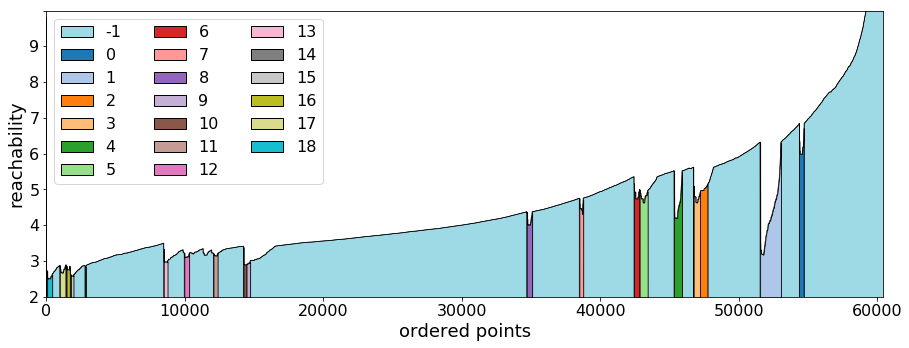

In [38]:
# list of colormapshttps://matplotlib.org/3.1.1/tutorials/colors/colormaps.html
import matplotlib.patches as mpatches
cmap = get_cmap('tab20')  # type: matplotlib.colors.ListedColormap
colors = cmap.colors  # type: list

fig, ax = plt.subplots(1, 1, figsize=(15,5) , sharex=True)

for j in [6]:
    ax.plot(optics_results_df['ordered_reachability'][j],color='black',linewidth=0.5)
    ax.set_xlim([0, len(optics_results_df['ordered_reachability'][j])])
    ax.set_ylabel('xi = ' + str(optics_results_df['xi'][j]))
    ax.set_ylim([2,10])
    ax.set_xlabel('ordered points',size=12)
    ax.set_ylabel('reachability',size=12)

    if j>0:
        plt.setp(ax.get_yticklabels()[-1], visible=False)
    
    # start color filling from parents to children - ie. from back to front
    legend_patchlist = list()
    pie_color_list = list()
    for i in np.unique(optics_results_df['ordered_clusters_labels'][j]):
        # np.mod cycles through the color set in case there is more clusters than colors
        cluster_x_not = np.where(optics_results_df['ordered_clusters_labels'][j]!=i)[0]
        cluster_y = optics_results_df['ordered_reachability'][j].copy()
        cluster_y[cluster_x_not] = 0
        ax.fill_between(np.linspace(0,len(cluster_y)-1,len(cluster_y),endpoint=True), cluster_y, where=cluster_y>0, interpolate=True, facecolor=colors[np.mod(i,len(colors))], edgecolor='black',linewidth=0.8)
        pie_color_list.append(colors[np.mod(i,len(colors))])
        patch = mpatches.Patch(facecolor=colors[np.mod(i,len(colors))], edgecolor='black', label=str(i))
        legend_patchlist.append(patch)
    ax.legend(handles=legend_patchlist,ncol=3,loc='upper left', fontsize=16)
plt.subplots_adjust(hspace = 0,top=0.92)
#fig.text(0.08, 0.5, 'reachability distance', va='center', rotation='vertical',size=12)
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
fig.savefig('plots/darnet_optics_reachability_plot002.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

## Section 3.4. OPTICS clusters continuity + sizes

In [21]:
dataset = features_pd_standard_scaled_104.iloc[optics_results_df[optics_results_df['xi'] == 0.002]['ordered_samples'].values[0],:].copy()
dataset['label'] = optics_results_df[optics_results_df['xi'] == 0.002]['ordered_clusters_labels'].values[0]
dataset.sort_index(inplace=True)

unique_clusters, unique_clusters_counts = np.unique(dataset['label'].values, return_counts=True)

continuity_boxplot_list = list()

for uq_cl in unique_clusters:
    continuity_boxplot_temp = list()
    temp = 0
    for i in range(len(dataset)):
        if dataset['label'][i]==uq_cl:
            temp+=1
        if dataset['label'][i]!=uq_cl and temp>0:
            continuity_boxplot_temp.append(temp/len(dataset))
            temp = 0
    continuity_boxplot_list.append(continuity_boxplot_temp)

In [23]:
print('Cluster counts :')
for i in range(len(unique_clusters_counts)):
    print('Cluster ' + str(unique_clusters[i]) + ' size : ' + str(unique_clusters_counts[i]*100/len(dataset)))
    #print('Cluster ' + str(label) + ' size : ' + str(count))
    #print(str(unique_clusters_counts[i]*100/22497))

Cluster counts :
Cluster -1 size : 87.17813021978931
Cluster 0 size : 0.5639439694378752
Cluster 1 size : 2.4823457423057205
Cluster 2 size : 0.9343939669571832
Cluster 3 size : 0.767360709147138
Cluster 4 size : 0.9525857079067921
Cluster 5 size : 0.970777448856401
Cluster 6 size : 0.6234805761820497
Cluster 7 size : 0.4647162915309177
Cluster 8 size : 0.6449799063952238
Cluster 9 size : 0.4547935237402219
Cluster 10 size : 0.34398928341078605
Cluster 11 size : 0.49944597879835284
Cluster 12 size : 0.5804819157557014
Cluster 13 size : 0.4498321398448741
Cluster 14 size : 0.11907321348834901
Cluster 15 size : 0.3076058015115683
Cluster 16 size : 0.3886417384689169
Cluster 17 size : 0.6714406205037459
Cluster 18 size : 0.6019812459688756


Cluster min/max -1: 1.6537946317826253e-05/0.0012238080275191426
0.12238080275191426
Cluster min/max 0: 1.6537946317826253e-05/3.3075892635652505e-05
0.0033075892635652505
Cluster min/max 1: 1.6537946317826253e-05/4.961383895347876e-05
0.0049613838953478755
Cluster min/max 2: 1.6537946317826253e-05/3.3075892635652505e-05
0.0033075892635652505
Cluster min/max 3: 1.6537946317826253e-05/3.3075892635652505e-05
0.0033075892635652505
Cluster min/max 4: 1.6537946317826253e-05/3.3075892635652505e-05
0.0033075892635652505
Cluster min/max 5: 1.6537946317826253e-05/3.3075892635652505e-05
0.0033075892635652505
Cluster min/max 6: 1.6537946317826253e-05/3.3075892635652505e-05
0.0033075892635652505
Cluster min/max 7: 1.6537946317826253e-05/3.3075892635652505e-05
0.0033075892635652505
Cluster min/max 8: 1.6537946317826253e-05/3.3075892635652505e-05
0.0033075892635652505
Cluster min/max 9: 1.6537946317826253e-05/3.3075892635652505e-05
0.0033075892635652505
Cluster min/max 10: 1.6537946317826253e-05/3.3

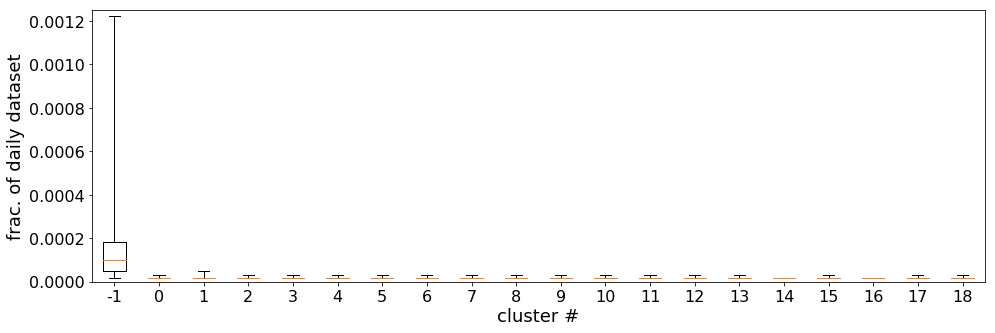

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(16, 5))

boxplot_data = continuity_boxplot_list
ax.boxplot(boxplot_data, whis='range',showfliers=True)
#ax.set_ylim(0,0.1)
ax.set_xticklabels(unique_clusters)
#ax.set_xlim(0.5,len(unique_clusters)+0.5)
ax.set_ylabel('frac. of daily dataset')
ax.set_xlabel('cluster #')
#ax.set_title('MAWI OPTICS cluster continuity')
for i,cl in zip(boxplot_data,unique_clusters):
    print('Cluster min/max ' +str(cl)+ ': ' +str(min(i))+ '/' +str(max(i)))
    print(str(max(i)*100))
ax.set_ylim([0,0.00125])
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
fig.savefig('plots/darknet_optics_clusters_continuity002.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

## Section 3.5. OPTICS Interpretation by feature values

In [35]:
#mawi:
#reordered_columns_orig = ['vol(frame_len)', 'avg(frame_len)', 'avg(tcp_len)', 'avg(tcp_winsize)', 'avg(ip_len)', 'entropy(frame_len)', 'entropy(tcp_len)', 'entropy(tcp_winsize)','entropy(ip_len)','var(frame_len)', 'var(tcp_len)', 'var(tcp_winsize)', 'var(ip_len)','stddev(frame_len)', 'stddev(tcp_len)','stddev(tcp_winsize)', 'stddev(ip_len)', 'p50(frame_len)', 'p75(frame_len)', 'p50(ip_len)', 'p75(ip_len)','p50(tcp_len)','p1(tcp_winsize)','p2(tcp_winsize)','p5(tcp_winsize)','p10(tcp_winsize)', 'p15(tcp_winsize)', 'p20(tcp_winsize)', 'p25(tcp_winsize)', 'p50(tcp_winsize)', 'p75(tcp_winsize)', 'p97(tcp_winsize)', 'p99(tcp_winsize)','entropy(tcp_flags)', 'frac_tcpflag(tcp_flags_ack)','frac_tcpflag(tcp_flags_push)', 'frac_tcpflag(tcp_flags_syn)','entropy_1st_ip_octet(ip_dst)','entropy_2nd_ip_octet(ip_dst)', 'entropy_3rd_ip_octet(ip_dst)', 'entropy_4th_ip_octet(ip_dst)','entropy_1st_ip_octet(ip_src)', 'entropy_2nd_ip_octet(ip_src)','entropy_3rd_ip_octet(ip_src)','entropy_4th_ip_octet(ip_src)','frac_tcp(ip_proto)','frac_udp(ip_proto)', 'frac_gre(ip_proto)','frac_icmp(ip_proto)','entropy(icmp_type)','frac_echo_request(icmp_type)', 'frac_echo_reply(icmp_type)', 'frac_ipv4', 'frac_ipv6','frac_well_known(tcp_dstport)','frac_well_known(tcp_srcport)', 'frac_well_known(udp_dstport)','frac_well_known(udp_srcport)','frac_registered_ports(tcp_dstport)','frac_registered_ports(tcp_srcport)','frac_registered_ports(udp_dstport)','frac_registered_ports(udp_srcport)','frac_dynamic_ports(tcp_dstport)','frac_dynamic_ports(tcp_srcport)','frac_dynamic_ports(udp_dstport)','frac_dynamic_ports(udp_srcport)', 'frac_document_retrieval_tcp(tcp_dstport)','frac_document_retrieval_tcp(tcp_srcport)','frac_mail_tcp(tcp_dstport)', 'frac_mail_tcp(tcp_srcport)','frac_networking_udp(udp_dstport)','frac_networking_udp(udp_srcport)','frac_remote_access_tcp(tcp_dstport)','frac_remote_access_tcp(tcp_srcport)']
#darknet:
reordered_columns_orig = ['vol(frame_len)', 'num_pkts(frame_len)', 'avg(frame_len)', 'avg(ip_len)', 'avg(ip_ttl)', 'avg(tcp_winsize)','entropy(frame_len)', 'entropy(ip_len)','entropy(ip_ttl)', 'entropy(tcp_winsize)','p95(frame_len)', 'p97(frame_len)','p99(frame_len)','p95(ip_len)', 'p99(ip_len)', 'p97(ip_len)','p1(ip_ttl)', 'p2(ip_ttl)','p5(ip_ttl)','p10(ip_ttl)','p15(ip_ttl)',  'p20(ip_ttl)', 'p25(ip_ttl)', 'p50(ip_ttl)', 'p75(ip_ttl)','p90(ip_ttl)','p95(ip_ttl)', 'p97(ip_ttl)', 'p99(ip_ttl)','p50(tcp_winsize)','p75(tcp_winsize)','stddev(frame_len)', 'stddev(ip_len)', 'stddev(ip_ttl)','stddev(tcp_winsize)', 'var(frame_len)','var(ip_len)','var(ip_ttl)','var(tcp_winsize)','max(frame_len)','max(ip_len)','min(ip_ttl)','max(ip_ttl)', 'max(tcp_winsize)', 'entropy_1st_IP_octet(ip_src)', 'entropy_2nd_IP_octet(ip_src)','entropy_3rd_IP_octet(ip_src)','entropy_4th_IP_octet(ip_src)','entropy_3rd_IP_octet(ip_dst)','entropy_4th_IP_octet(ip_dst)', 'entropy(icmp_type)', 'frac_destination_unreachable(icmp_type)','frac_echo_request(icmp_type)','num_destination_unreachable(icmp_type)','num_echo_request(icmp_type)','frac_document_retrieval_tcp(tcp_dstport)','frac_document_retrieval_tcp(tcp_srcport)','frac_document_retrieval_udp(udp_dstport)','num_document_retrieval_tcp(tcp_dstport)','num_document_retrieval_tcp(tcp_srcport)','num_document_retrieval_udp(udp_dstport)','frac_dynamic_ports(tcp_dstport)','frac_dynamic_ports(tcp_srcport)','frac_dynamic_ports(udp_dstport)','frac_dynamic_ports(udp_srcport)','num_dynamic_ports(tcp_dstport)', 'num_dynamic_ports(tcp_srcport)','num_dynamic_ports(udp_dstport)', 'num_dynamic_ports(udp_srcport)', 'frac_icmp(ip_proto)', 'frac_tcp(ip_proto)','frac_udp(ip_proto)','num_icmp(ip_proto)','num_tcp(ip_proto)','num_udp(ip_proto)','entropy(tcp_flags)','frac_tcpflag(tcp_flags_ack)', 'frac_tcpflag(tcp_flags_cwr)','frac_tcpflag(tcp_flags_ecn)', 'frac_tcpflag(tcp_flags_syn)', 'num_tcpflag(tcp_flags_ack)','num_tcpflag(tcp_flags_cwr)','num_tcpflag(tcp_flags_ecn)', 'num_tcpflag(tcp_flags_syn)','frac_networking_udp(udp_dstport)','num_networking_udp(udp_dstport)','frac_registered_ports(tcp_dstport)','frac_registered_ports(tcp_srcport)','frac_registered_ports(udp_dstport)','frac_registered_ports(udp_srcport)','num_registered_ports(tcp_dstport)','num_registered_ports(tcp_srcport)','num_registered_ports(udp_dstport)','num_registered_ports(udp_srcport)','frac_remote_access_tcp(tcp_dstport)','num_remote_access_tcp(tcp_dstport)','frac_well_known(tcp_dstport)','frac_well_known(tcp_srcport)', 'frac_well_known(udp_dstport)','frac_well_known(udp_srcport)','num_well_known(tcp_dstport)','num_well_known(tcp_srcport)', 'num_well_known(udp_dstport)','num_well_known(udp_srcport)']
# reverse the list for boxplots
reordered_columns = reordered_columns_orig[::-1]

# define features and groudn truth datasets we will use
dataset = features_pd_standard_scaled_104[reordered_columns].iloc[optics_results_df[optics_results_df['xi'] == 0.002]['ordered_samples'].values[0],:].copy()
dataset['label'] = optics_results_df[optics_results_df['xi'] == 0.002]['ordered_clusters_labels'].values[0]
dataset.sort_index(inplace=True)

# "normal" - largest cluster
largest_cluster = dataset['label'].value_counts()[:1].index[0]    

# mean feature values for each cluster
clusters_interpretation_features = dataset.groupby('label').mean()

#subtract largest cluster features average values from cluster feaures
largest_cluster_features = clusters_interpretation_features.loc[largest_cluster]
clusters_interpretation_features_norm = clusters_interpretation_features.copy()
for index in clusters_interpretation_features.index.values:
    clusters_interpretation_features_norm.loc[index] = clusters_interpretation_features.loc[index].sub(largest_cluster_features)

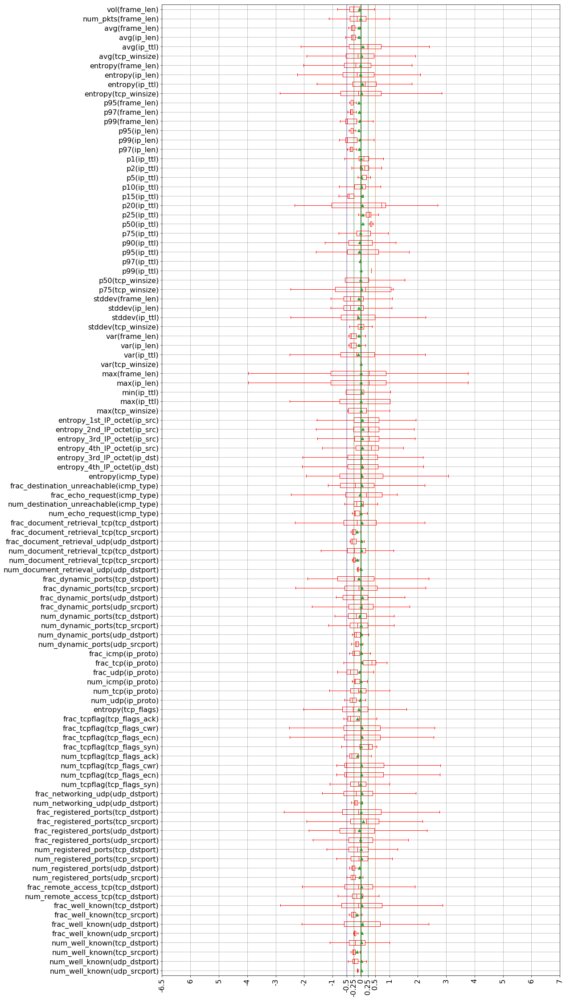

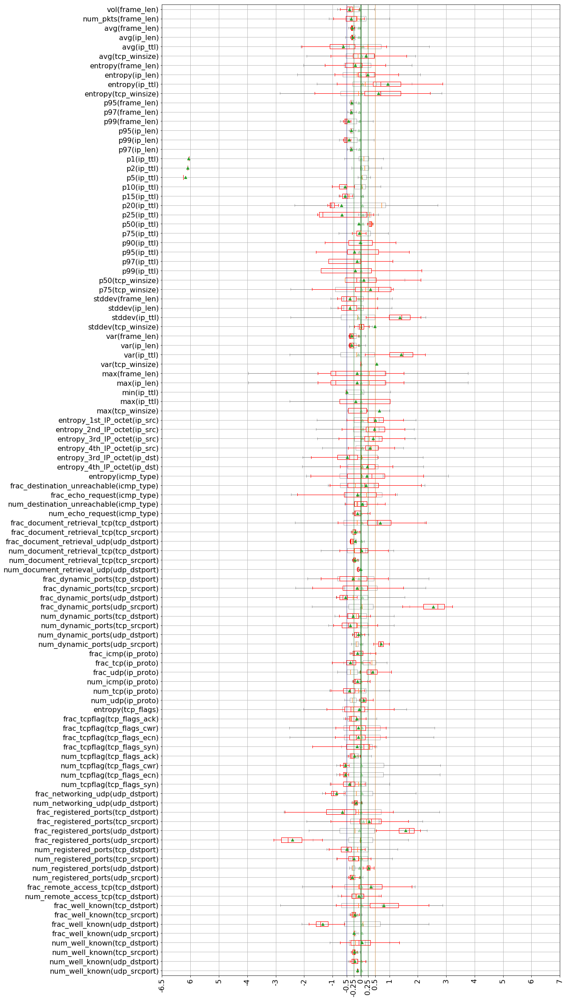

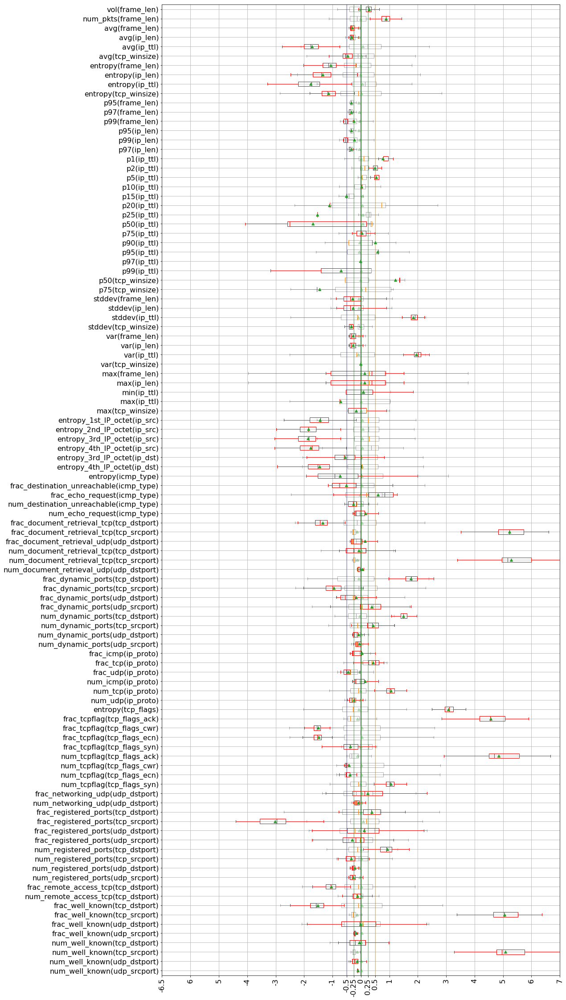

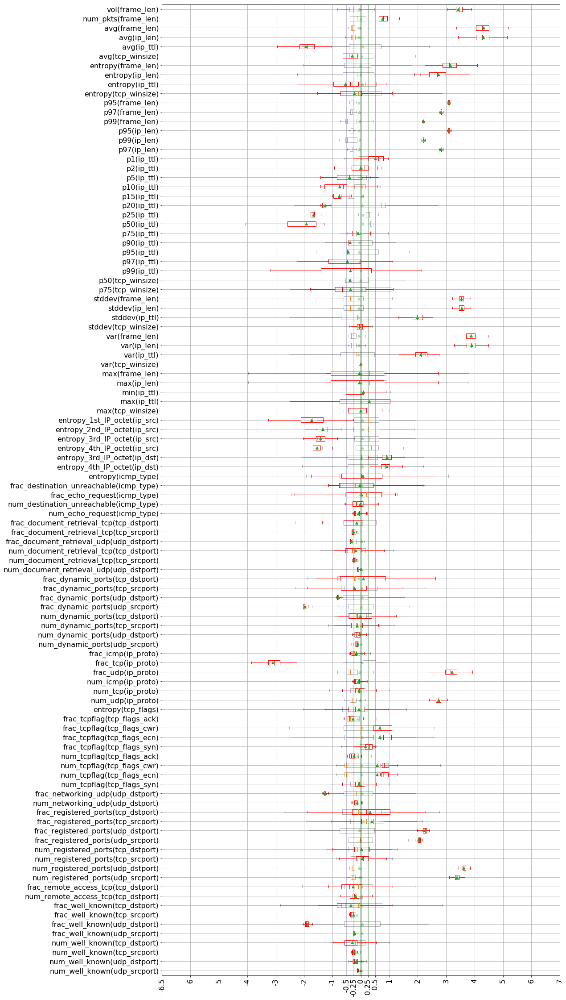

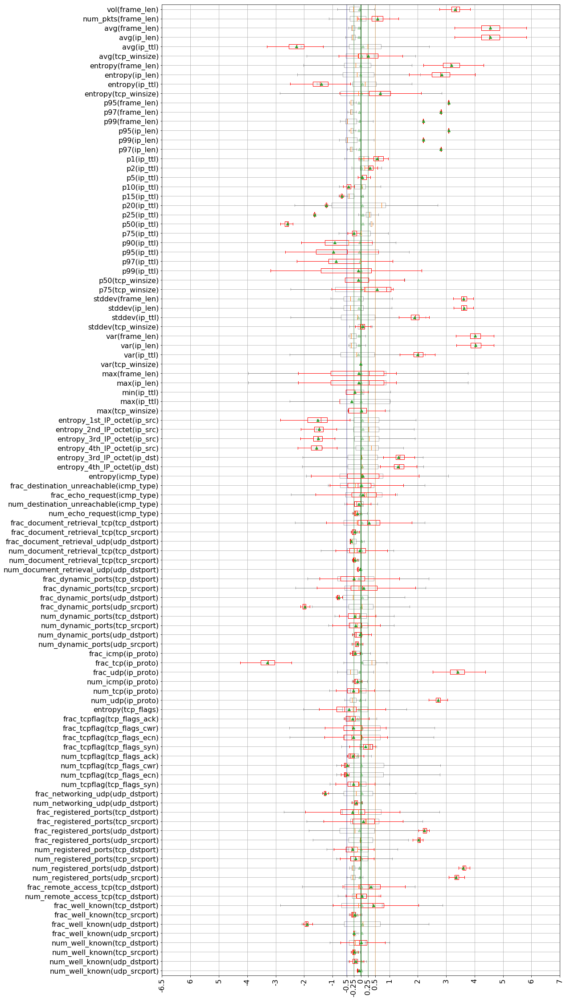

...

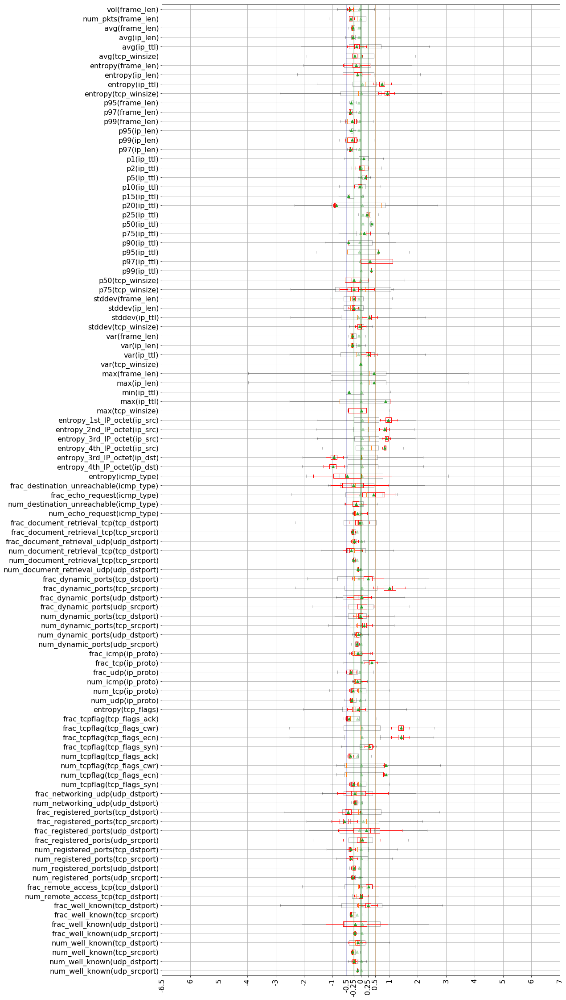

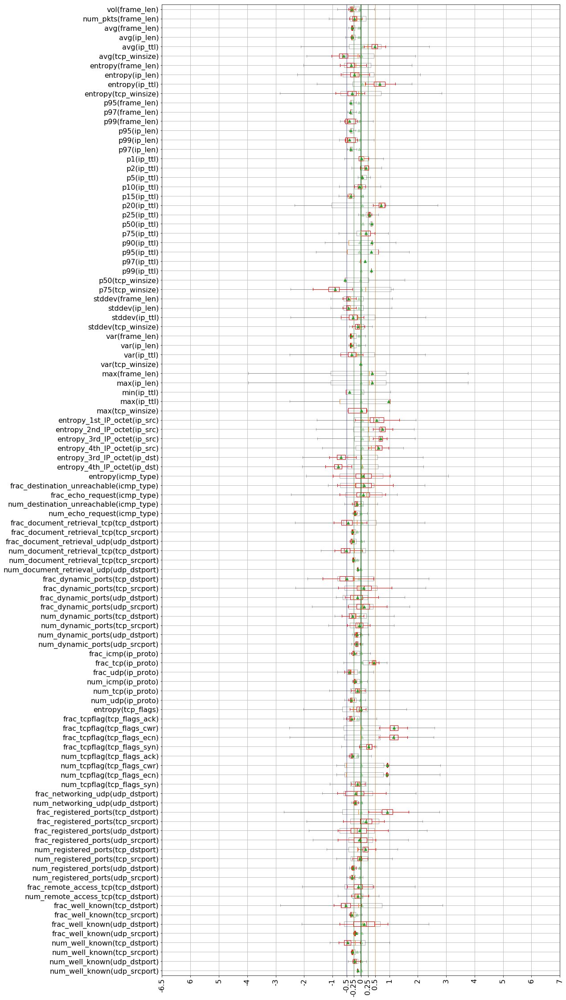

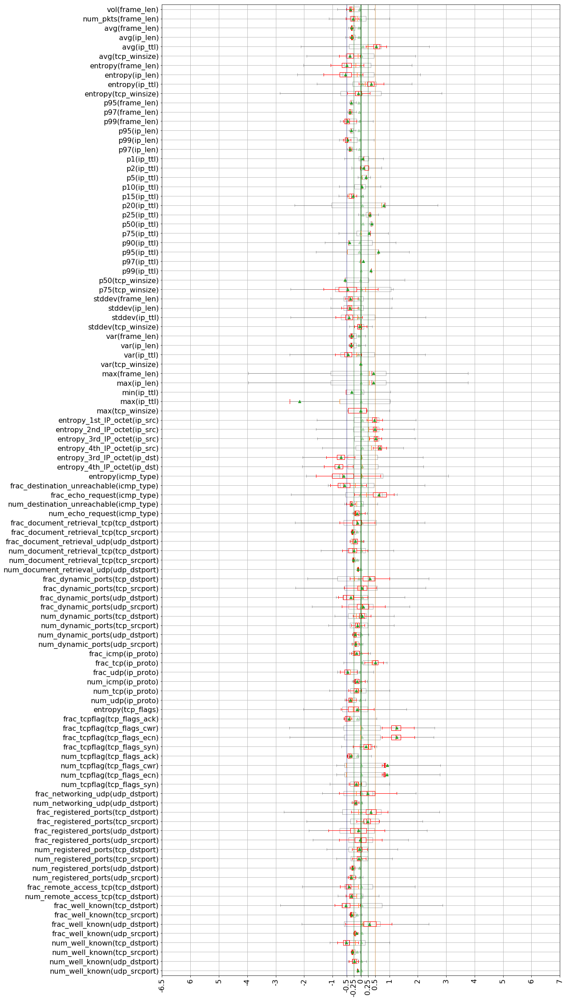

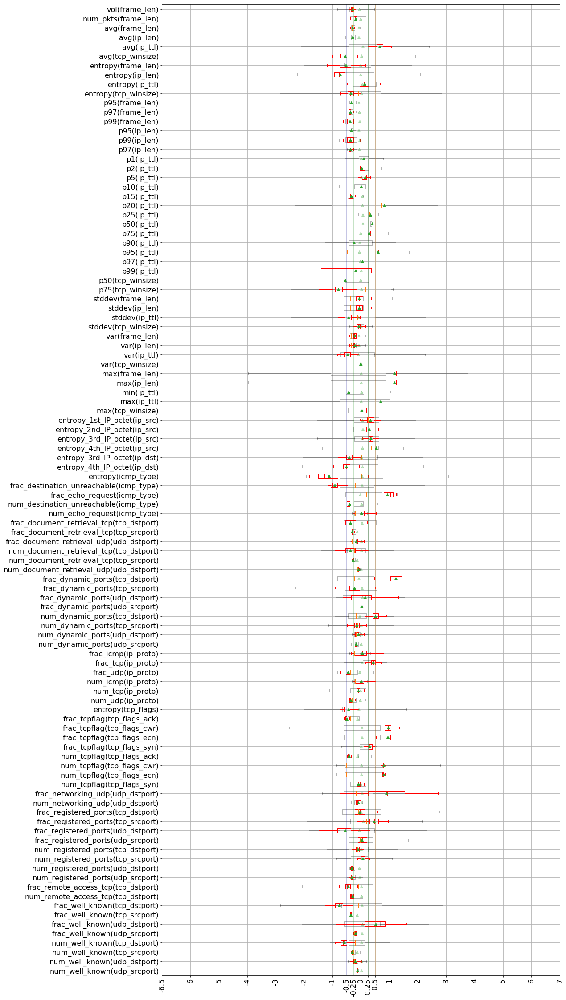

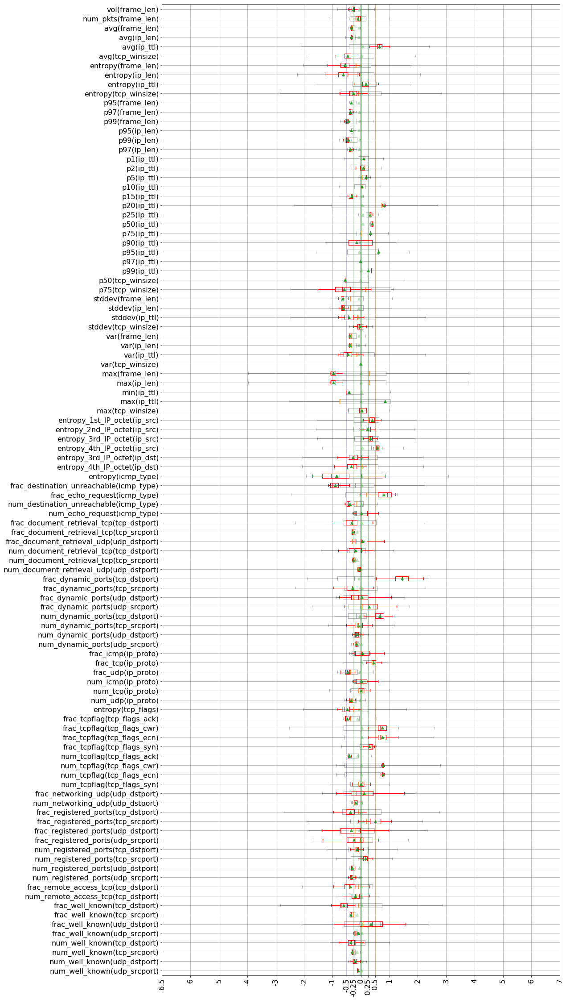

In [36]:
# I used pandas boxplot as its faster, I need less parameters and it puts grid/features names
for i in range(-1,19):
    fig, ax = plt.subplots(1, 1, figsize=(16,40), sharex=True)
    # I use matplotlib boxplot as I couldnt figure out how to make pandas boxplot transparent
    boxplot = ax.boxplot(dataset[dataset['label']==largest_cluster][dataset.columns[:-1]].values, vert=False,showfliers=False,boxprops=dict(alpha=.3),whiskerprops=dict(alpha=.3),capprops=dict(alpha=.3),meanprops=dict(alpha=.3),showmeans=True)
    dataset[dataset['label']==i][dataset.columns[:-1]].plot(fontsize = 16,kind='box',color=dict(boxes='red', whiskers='red', medians='red', caps='red'),vert=False,showfliers=False,ax=ax,grid=True,showmeans=True)
    ax.set_xlim([-7,7])
    ax.set_xticks([-7,-6,-5,-4,-3,-2,-1,-0.5,-0.25,0,0.25,0.5,1,2,3,4,5,6,7])
    ax.set_xticklabels(['-6.5','6','5','-4','-3','-2','-1','-0.5','-0.25','0','0.25','0.5','1','2','3','4','5','6','7'],rotation=90)
    ax.axvline(0.5, color='darkorange',alpha=.3)
    ax.axvline(0.25, color='green',alpha=.3)
    ax.axvline(-0.5, color='darkblue',alpha=.3)
    ax.axvline(-0.25, color='green',alpha=.3)
    ax.axvline(0, color='darkgreen')
    fig.savefig('plots/darknet104_xi002_cluster_'+str(i)+'_feature_interpretation.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [37]:
# .T - table is transposed, we see features in rows
# midpoint of background gradient can't be set to fix values, i.e. 1, it wan be only shifted by custome functions in interval [0,1] for whole table
# axis=1 colormap is applied rowise
# 
clusters_interpretation_features[reordered_columns_orig].T.style.background_gradient(cmap='coolwarm',axis=1)

# Section 4. HDBSCAN

## Section 4.1. Computation by hdbscan library in python
https://github.com/scikit-learn-contrib/hdbscan
https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html

In [3]:
labels_list = list()
cluster_hierarchy_list = list()
probabilities_list = list()
persistence_list = list()
outlier_scores_list = list()
relative_validity_list = list()
minimum_spanning_tree_list = list()
condensed_tree_list = list()
minpts_list = [105,208]

for minpts in minpts_list:
    # hdbscan.robust_single_linkage_.RobustSingleLinkage(cut=0.4, k=5, gamma=5)
    # gamma: Ignore any clusters in the flat clustering with size less than gamma, and declare points in such clusters as noise points.
    # k : Reachability distances will be computed with regard to the k nearest neighbors.
    # cut : The reachability distance value to cut the cluster heirarchy at to derive a flat cluster labelling.
    #
    # cluster_selection_method = ['eom','leaf']
    # allow_single_cluster=True
    hdbscan_clust = hdbscan.HDBSCAN(min_samples=minpts,min_cluster_size=10,cluster_selection_method='eom',approx_min_span_tree=False,gen_min_span_tree=True)
    hdbscan_clust.fit(features_pd_standard_scaled_104.values)
    #
    labels_list.append(hdbscan_clust.labels_)
    #cluster_hierarchy_list.append(hdbscan_clust.single_linkage_tree_
    probabilities_list.append(hdbscan_clust.probabilities_)
    persistence_list.append(hdbscan_clust.cluster_persistence_)
    outlier_scores_list.append(hdbscan_clust.outlier_scores_)
    #relative_validity_list.append(hdbscan_clust.relative_validity_)
    #minimum_spanning_tree_list.append(hdbscan_clust.minimum_spanning_tree_)
    condensed_tree_list.append(hdbscan_clust.condensed_tree_)

/home/big-dama/anaconda3/lib/python3.7/site-packages/hdbscan/hdbscan_.py:217: UserWarning: Cannot generate Minimum Spanning Tree; the implemented Prim's does not produce the full minimum spanning tree 
  'the full minimum spanning tree ', UserWarning)
/home/big-dama/anaconda3/lib/python3.7/site-packages/hdbscan/hdbscan_.py:217: UserWarning: Cannot generate Minimum Spanning Tree; the implemented Prim's does not produce the full minimum spanning tree 
  'the full minimum spanning tree ', UserWarning)


In [5]:
# create structured pandas
hdbscan_results = {'minpts' : minpts_list,
                       'persistence' : persistence_list,
                       'probabilities' : probabilities_list,
                       'outlier_scores' : outlier_scores_list,
                       'labels' : labels_list,
                       #'relative_validity' : relative_validity_list,
                       #'minimum_spanning_tree' : minimum_spanning_tree_list,
                       'condensed_tree' : condensed_tree_list}
                       #'cluster_hierarchy' : cluster_hierarchy_list}
hdbscan_results_df = pd.DataFrame(hdbscan_results)

In [11]:
# save/load results
#hdbscan_results_df.to_pickle('hdbscan_eom_results_df.csv')
hdbscan_results_df = pd.read_pickle('hdbscan_eom_results_df.csv')

In [12]:
hdbscan_results_df.rename(columns={'labels':'clusters_labels'},inplace=True)
noise_index_list= list()
for labels in hdbscan_results_df['clusters_labels']:
    noise_index_list.append(np.where(labels==-1)[0])
hdbscan_results_df['noise_index'] = noise_index_list

In [29]:
#hdbscan_results_df.to_pickle('hdbscan_eom_results_df.csv')
hdbscan_results_df = pd.read_pickle('results/hdbscan_eom_results_df.csv')

## Section 4.2. HDBSCAN results visualization by condensed trees

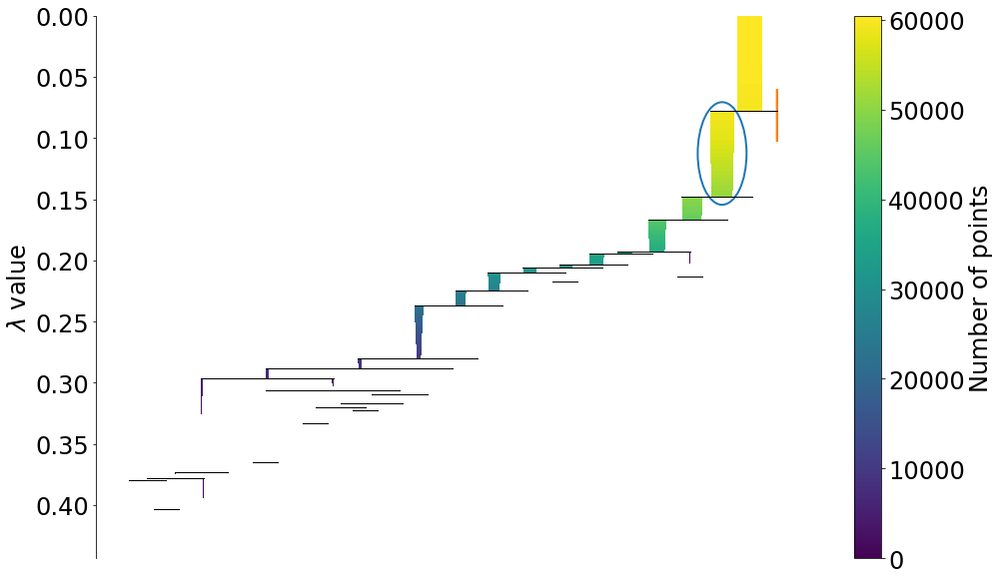

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(16,10))
hdbscan_results_df['condensed_tree'][0].plot(select_clusters=True, selection_palette=sns.color_palette(),axis=ax,colorbar=True)
cbar_ax = fig.axes[-1]
matplotlib.rcParams.update({'font.size': 24})
fig.savefig('plots/hdbscan_condensed_tree_minpts105_mincl10.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

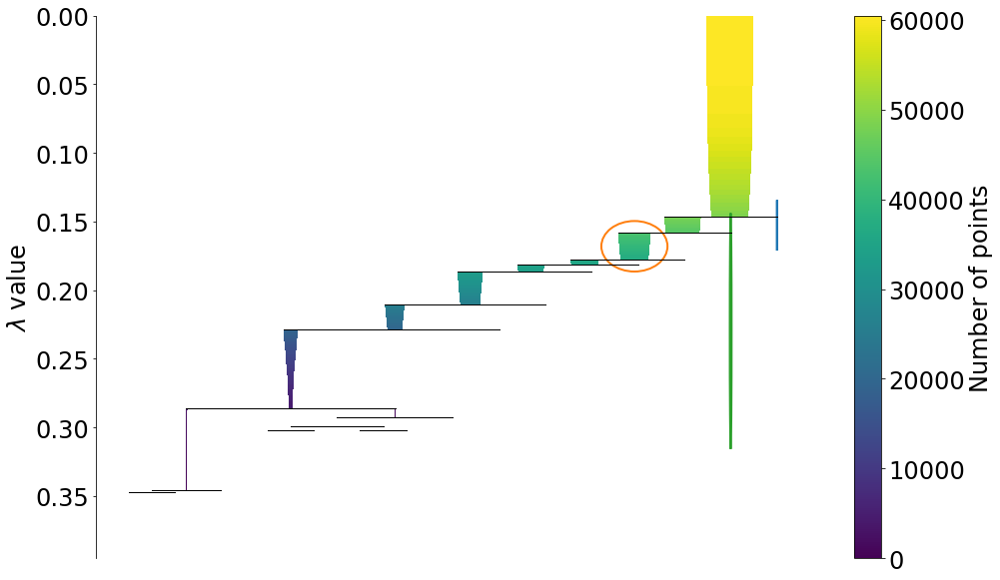

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(16,10))
hdbscan_results_df['condensed_tree'][1].plot(select_clusters=True, selection_palette=sns.color_palette(),axis=ax,colorbar=True)
cbar_ax = fig.axes[-1]
matplotlib.rcParams.update({'font.size': 24})
fig.savefig('plots/hdbscan_condensed_tree_minpts208_mincl10.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

## Section 4.3. HDBSCAN clusters continuity + sizes

In [6]:
unique_clusters, counts = np.unique(hdbscan_results_df['clusters_labels'][hdbscan_results_df['minpts']==208].values[0],return_counts=True)
counts = counts/float(len(features_pd_standard_scaled_104))

print('Cluster counts HDBSCAN, minpts=212, MinCl=10 :')
for label,count in zip(unique_clusters,counts):
    print('Cluster ' + str(label) + ' size : ' + str(count))

Cluster counts HDBSCAN, minpts=212, MinCl=10 :
Cluster -1 size : 0.26444176162204175
Cluster 0 size : 0.0021995468602708916
Cluster 1 size : 0.7137777630773811
Cluster 2 size : 0.019580928440306282


Cluster min/max -1: 1.6537946317826253e-05/0.0002480691947673938
0.02480691947673938
Cluster min/max 0: 1.6537946317826253e-05/1.6537946317826253e-05
0.0016537946317826252
Cluster min/max 1: 1.6537946317826253e-05/0.0005457522284882663
0.054575222848826634
Cluster min/max 2: 1.6537946317826253e-05/4.961383895347876e-05
0.0049613838953478755


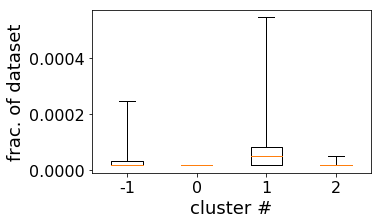

In [7]:
dataset = hdbscan_results_df['clusters_labels'][hdbscan_results_df['minpts']==208].values[0].copy()
continuity_boxplot_list = list()
for uq_cl in unique_clusters:
    continuity_boxplot_temp = list()
    temp = 0
    for i in range(len(dataset)):
        if dataset[i]==uq_cl:
            temp+=1
        if dataset[i]!=uq_cl and temp>0:
            continuity_boxplot_temp.append(temp/len(dataset))
            temp = 0
    continuity_boxplot_list.append(continuity_boxplot_temp)

fig, ax = plt.subplots(1, 1, figsize=(5, 3))

boxplot_data = continuity_boxplot_list
ax.boxplot(boxplot_data, whis='range',showfliers=True)
#ax.set_ylim(0,0.1)
ax.set_xticklabels(unique_clusters)
#ax.set_xlim(0.5,len(unique_clusters)+0.5)
ax.set_ylabel('frac. of dataset')
ax.set_xlabel('cluster #')
#ax.set_title('HDBSCAN cluster continuity')
for i,cl in zip(boxplot_data,unique_clusters):
    print('Cluster min/max ' +str(cl)+ ': ' +str(min(i))+ '/' +str(max(i)))
    print(str(max(i)*100))
#ax.set_ylim([0,0.7])
ax.xaxis.label.set_size(18)
ax.yaxis.label.set_size(18)
ax.tick_params(labelsize=16)
fig.savefig('plots/hdbscan_clusters_continuity_minpts208_mincl10.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

## Section 4.4 HDBSCAN interpretation by feature values

In [39]:
#mawi:
#reordered_columns_orig = ['vol(frame_len)', 'avg(frame_len)', 'avg(tcp_len)', 'avg(tcp_winsize)', 'avg(ip_len)', 'entropy(frame_len)', 'entropy(tcp_len)', 'entropy(tcp_winsize)','entropy(ip_len)','var(frame_len)', 'var(tcp_len)', 'var(tcp_winsize)', 'var(ip_len)','stddev(frame_len)', 'stddev(tcp_len)','stddev(tcp_winsize)', 'stddev(ip_len)', 'p50(frame_len)', 'p75(frame_len)', 'p50(ip_len)', 'p75(ip_len)','p50(tcp_len)','p1(tcp_winsize)','p2(tcp_winsize)','p5(tcp_winsize)','p10(tcp_winsize)', 'p15(tcp_winsize)', 'p20(tcp_winsize)', 'p25(tcp_winsize)', 'p50(tcp_winsize)', 'p75(tcp_winsize)', 'p97(tcp_winsize)', 'p99(tcp_winsize)','entropy(tcp_flags)', 'frac_tcpflag(tcp_flags_ack)','frac_tcpflag(tcp_flags_push)', 'frac_tcpflag(tcp_flags_syn)','entropy_1st_ip_octet(ip_dst)','entropy_2nd_ip_octet(ip_dst)', 'entropy_3rd_ip_octet(ip_dst)', 'entropy_4th_ip_octet(ip_dst)','entropy_1st_ip_octet(ip_src)', 'entropy_2nd_ip_octet(ip_src)','entropy_3rd_ip_octet(ip_src)','entropy_4th_ip_octet(ip_src)','frac_tcp(ip_proto)','frac_udp(ip_proto)', 'frac_gre(ip_proto)','frac_icmp(ip_proto)','entropy(icmp_type)','frac_echo_request(icmp_type)', 'frac_echo_reply(icmp_type)', 'frac_ipv4', 'frac_ipv6','frac_well_known(tcp_dstport)','frac_well_known(tcp_srcport)', 'frac_well_known(udp_dstport)','frac_well_known(udp_srcport)','frac_registered_ports(tcp_dstport)','frac_registered_ports(tcp_srcport)','frac_registered_ports(udp_dstport)','frac_registered_ports(udp_srcport)','frac_dynamic_ports(tcp_dstport)','frac_dynamic_ports(tcp_srcport)','frac_dynamic_ports(udp_dstport)','frac_dynamic_ports(udp_srcport)', 'frac_document_retrieval_tcp(tcp_dstport)','frac_document_retrieval_tcp(tcp_srcport)','frac_mail_tcp(tcp_dstport)', 'frac_mail_tcp(tcp_srcport)','frac_networking_udp(udp_dstport)','frac_networking_udp(udp_srcport)','frac_remote_access_tcp(tcp_dstport)','frac_remote_access_tcp(tcp_srcport)']
#darknet:
reordered_columns_orig = ['vol(frame_len)', 'num_pkts(frame_len)', 'avg(frame_len)', 'avg(ip_len)', 'avg(ip_ttl)', 'avg(tcp_winsize)','entropy(frame_len)', 'entropy(ip_len)','entropy(ip_ttl)', 'entropy(tcp_winsize)','p95(frame_len)', 'p97(frame_len)','p99(frame_len)','p95(ip_len)', 'p99(ip_len)', 'p97(ip_len)','p1(ip_ttl)', 'p2(ip_ttl)','p5(ip_ttl)','p10(ip_ttl)','p15(ip_ttl)',  'p20(ip_ttl)', 'p25(ip_ttl)', 'p50(ip_ttl)', 'p75(ip_ttl)','p90(ip_ttl)','p95(ip_ttl)', 'p97(ip_ttl)', 'p99(ip_ttl)','p50(tcp_winsize)','p75(tcp_winsize)','stddev(frame_len)', 'stddev(ip_len)', 'stddev(ip_ttl)','stddev(tcp_winsize)', 'var(frame_len)','var(ip_len)','var(ip_ttl)','var(tcp_winsize)','max(frame_len)','max(ip_len)','min(ip_ttl)','max(ip_ttl)', 'max(tcp_winsize)', 'entropy_1st_IP_octet(ip_src)', 'entropy_2nd_IP_octet(ip_src)','entropy_3rd_IP_octet(ip_src)','entropy_4th_IP_octet(ip_src)','entropy_3rd_IP_octet(ip_dst)','entropy_4th_IP_octet(ip_dst)', 'entropy(icmp_type)', 'frac_destination_unreachable(icmp_type)','frac_echo_request(icmp_type)','num_destination_unreachable(icmp_type)','num_echo_request(icmp_type)','frac_document_retrieval_tcp(tcp_dstport)','frac_document_retrieval_tcp(tcp_srcport)','frac_document_retrieval_udp(udp_dstport)','num_document_retrieval_tcp(tcp_dstport)','num_document_retrieval_tcp(tcp_srcport)','num_document_retrieval_udp(udp_dstport)','frac_dynamic_ports(tcp_dstport)','frac_dynamic_ports(tcp_srcport)','frac_dynamic_ports(udp_dstport)','frac_dynamic_ports(udp_srcport)','num_dynamic_ports(tcp_dstport)', 'num_dynamic_ports(tcp_srcport)','num_dynamic_ports(udp_dstport)', 'num_dynamic_ports(udp_srcport)', 'frac_icmp(ip_proto)', 'frac_tcp(ip_proto)','frac_udp(ip_proto)','num_icmp(ip_proto)','num_tcp(ip_proto)','num_udp(ip_proto)','entropy(tcp_flags)','frac_tcpflag(tcp_flags_ack)', 'frac_tcpflag(tcp_flags_cwr)','frac_tcpflag(tcp_flags_ecn)', 'frac_tcpflag(tcp_flags_syn)', 'num_tcpflag(tcp_flags_ack)','num_tcpflag(tcp_flags_cwr)','num_tcpflag(tcp_flags_ecn)', 'num_tcpflag(tcp_flags_syn)','frac_networking_udp(udp_dstport)','num_networking_udp(udp_dstport)','frac_registered_ports(tcp_dstport)','frac_registered_ports(tcp_srcport)','frac_registered_ports(udp_dstport)','frac_registered_ports(udp_srcport)','num_registered_ports(tcp_dstport)','num_registered_ports(tcp_srcport)','num_registered_ports(udp_dstport)','num_registered_ports(udp_srcport)','frac_remote_access_tcp(tcp_dstport)','num_remote_access_tcp(tcp_dstport)','frac_well_known(tcp_dstport)','frac_well_known(tcp_srcport)', 'frac_well_known(udp_dstport)','frac_well_known(udp_srcport)','num_well_known(tcp_dstport)','num_well_known(tcp_srcport)', 'num_well_known(udp_dstport)','num_well_known(udp_srcport)']
# reverse the list for boxplots
reordered_columns = reordered_columns_orig[::-1]

# define features and groudn truth datasets we will use
dataset = features_pd_standard_scaled_104[reordered_columns].copy()
dataset['label'] = hdbscan_results_df['clusters_labels'][hdbscan_results_df['minpts']==208].values[0].copy()

# "normal" - largest cluster
largest_cluster = dataset['label'].value_counts()[:1].index[0]    

# mean feature values for each cluster
clusters_interpretation_features = dataset.groupby('label').mean()

#subtract largest cluster features average values from cluster feaures
largest_cluster_features = clusters_interpretation_features.loc[largest_cluster]
clusters_interpretation_features_norm = clusters_interpretation_features.copy()
for index in clusters_interpretation_features.index.values:
    clusters_interpretation_features_norm.loc[index] = clusters_interpretation_features.loc[index].sub(largest_cluster_features)

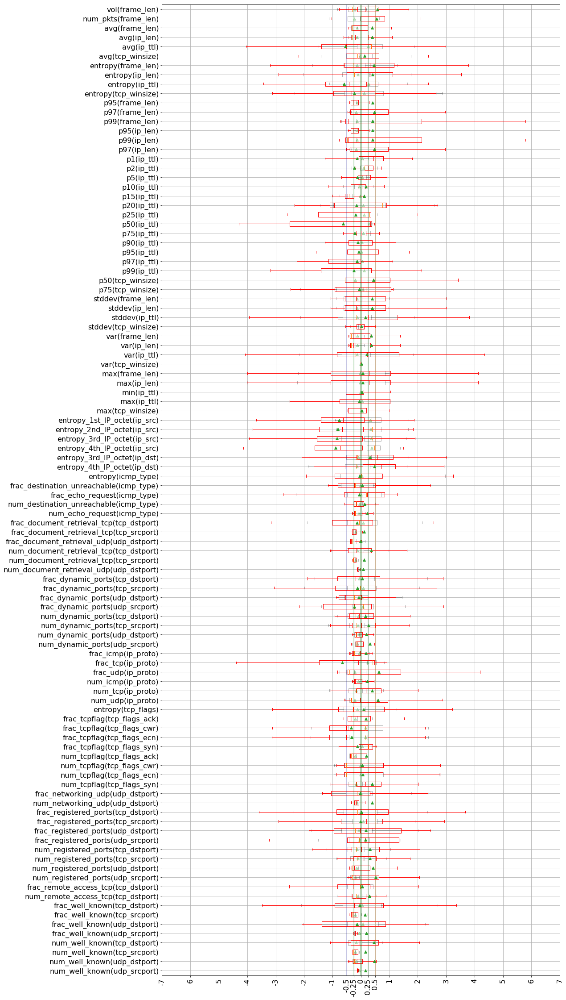

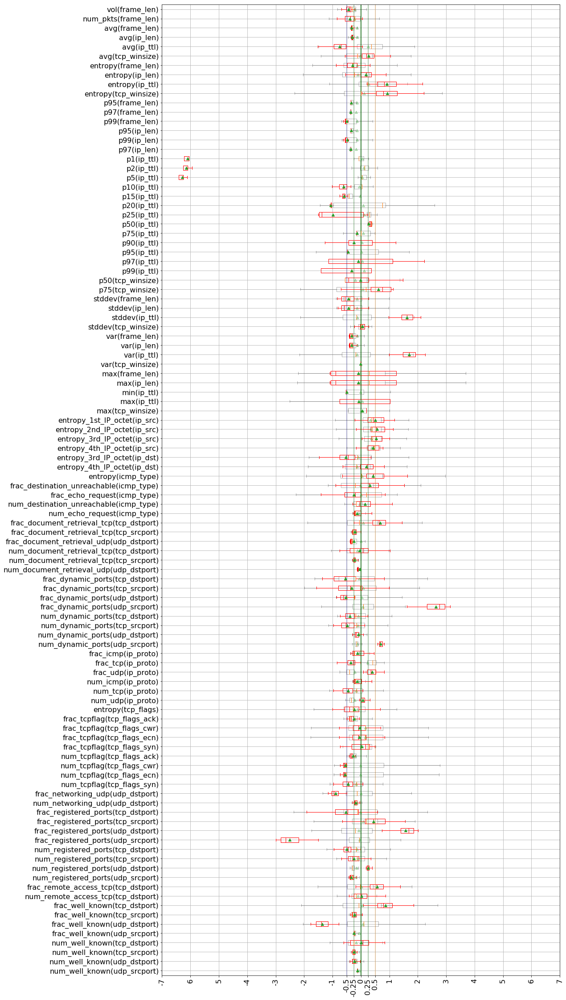

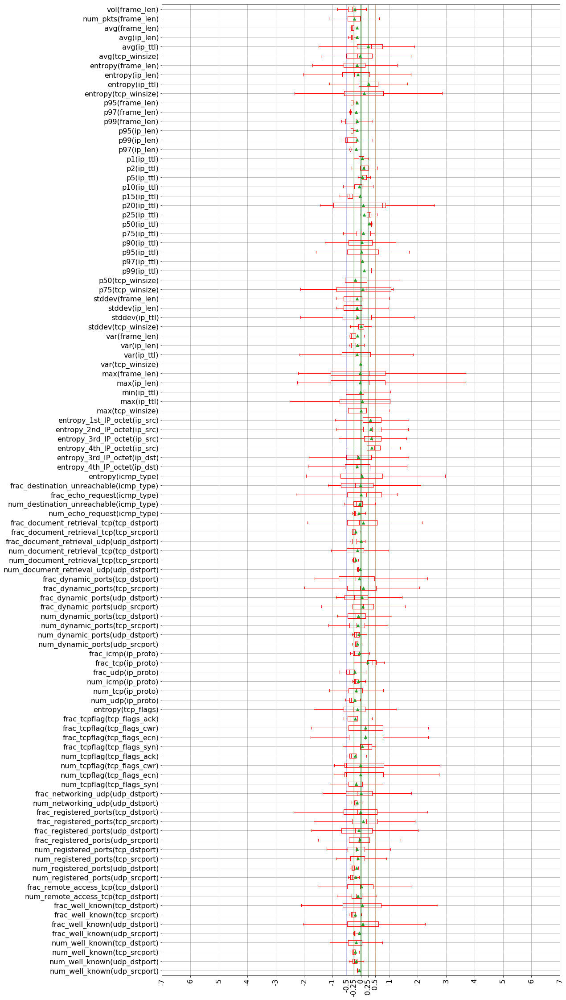

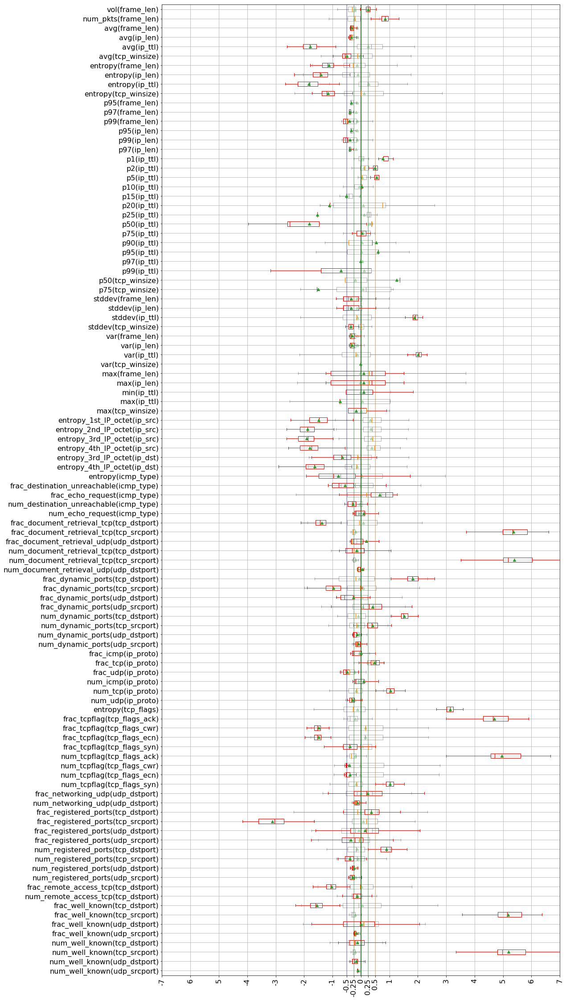

In [40]:
# I used pandas boxplot as its faster, I need less parameters and it puts grid/features names
for i in range(-1,3):
    fig, ax = plt.subplots(1, 1, figsize=(16,40), sharex=True)
    # I use matplotlib boxplot as I couldnt figure out how to make pandas boxplot transparent
    boxplot = ax.boxplot(dataset[dataset['label']==largest_cluster][dataset.columns[:-1]].values, vert=False,showfliers=False,boxprops=dict(alpha=.3),whiskerprops=dict(alpha=.3),capprops=dict(alpha=.3),meanprops=dict(alpha=.3),showmeans=True)
    dataset[dataset['label']==i][dataset.columns[:-1]].plot(fontsize = 16,kind='box',color=dict(boxes='red', whiskers='red', medians='red', caps='red'),vert=False,showfliers=False,ax=ax,grid=True,showmeans=True)
    ax.set_xlim([-7,7])
    ax.set_xticks([-7,-6,-5,-4,-3,-2,-1,-0.5,-0.25,0,0.25,0.5,1,2,3,4,5,6,7])
    ax.set_xticklabels(['-7','6','5','-4','-3','-2','-1','-0.5','-0.25','0','0.25','0.5','1','2','3','4','5','6','7'],rotation=90)
    ax.axvline(0.5, color='darkorange',alpha=.3)
    ax.axvline(0.25, color='green',alpha=.3)
    ax.axvline(-0.5, color='darkblue',alpha=.3)
    ax.axvline(-0.25, color='green',alpha=.3)
    ax.axvline(0, color='darkgreen')
    fig.savefig('plots/darknet104_hdbscan208_mincl10_cluster_'+str(i)+'_feature_interpretation.pdf',transparent=True,bbox_inches='tight', pad_inches=0, frameon=False)

In [10]:
# .T - table is transposed, we see features in rows
# midpoint of background gradient can't be set to fix values, i.e. 1, it wan be only shifted by custome functions in interval [0,1] for whole table
# axis=1 colormap is applied rowise
# 
clusters_interpretation_features[reordered_columns_orig].T.style.background_gradient(cmap='coolwarm',axis=1)

label,-1,0,1,2
vol(frame_len),0.586476,-0.430644,-0.222876,0.2524
num_pkts(frame_len),0.549601,-0.395304,-0.225679,0.848604
avg(frame_len),0.386876,-0.32574,-0.133434,-0.324166
avg(ip_len),0.39247,-0.316016,-0.134936,-0.34605
avg(ip_ttl),-0.544592,-0.749891,0.252982,-1.78291
avg(tcp_winsize),0.130713,0.27341,-0.035706,-0.494422
entropy(frame_len),0.454459,-0.29464,-0.136374,-1.13321
entropy(ip_len),0.402524,0.179376,-0.11082,-1.41659
entropy(ip_ttl),-0.600755,0.919603,0.27018,-1.83886
entropy(tcp_winsize),-0.237179,0.91977,0.11699,-1.1648


# [not applicable] Section 5. BONUS - Algorithms Outliers Jaccard similarity

OPTICS algorithm does not distinguish clearly Noise from rest of the dataset so this section is not applicable in this scenario

In [72]:
#len(mawi_hdbscan_results_df['noise_index'][mawi_hdbscan_results_df['minpts']==212].values[0])
unique_clusters, unique_clusters_counts = np.unique(optics_dataset['label'].values, return_counts=True)

In [41]:
# unique_clusters_counts

In [76]:
def jaccard_similarity(list1, list2):
    intersection = len(list(set(list1).intersection(list2)))
    #print(list(set(list1).intersection(list2)))
    union = (len(list1) + len(list2)) - intersection
    return float(intersection) / union

optics_dataset = features_pd_standard_scaled_104[reordered_columns].iloc[optics_results_df[optics_results_df['xi'] == 0.002]['ordered_samples'].values[0],:].copy()
optics_dataset['label'] = optics_results_df[optics_results_df['xi'] == 0.002]['ordered_clusters_labels'].values[0]
optics_dataset.sort_index(inplace=True)

optics_dataset[optics_dataset['label']==-1].index.values

dbscan_jaccard_similarity_list = list()
dbscan_jaccard_similarity_list.append(jaccard_similarity(dbscan_results_df['noise_index'][dbscan_results_df['min_samples']==208][5.9],dbscan_results_df['noise_index'][dbscan_results_df['min_samples']==208][5.9]))
dbscan_jaccard_similarity_list.append(jaccard_similarity(dbscan_results_df['noise_index'][dbscan_results_df['min_samples']==208][5.9],optics_dataset[optics_dataset['label']==-1].index.values))
dbscan_jaccard_similarity_list.append(jaccard_similarity(dbscan_results_df['noise_index'][dbscan_results_df['min_samples']==208][5.9],hdbscan_results_df['noise_index'][hdbscan_results_df['minpts']==208].values[0]))

optics_jaccard_similarity_list = list()
optics_jaccard_similarity_list.append(jaccard_similarity(optics_dataset[optics_dataset['label']==-1].index.values,dbscan_results_df['noise_index'][dbscan_results_df['min_samples']==208][5.9]))
optics_jaccard_similarity_list.append(jaccard_similarity(optics_dataset[optics_dataset['label']==-1].index.values,optics_dataset[optics_dataset['label']==-1].index.values))
optics_jaccard_similarity_list.append(jaccard_similarity(optics_dataset[optics_dataset['label']==-1].index.values,hdbscan_results_df['noise_index'][hdbscan_results_df['minpts']==208].values[0]))

hdbscan_jaccard_similarity_list = list()
hdbscan_jaccard_similarity_list.append(jaccard_similarity(hdbscan_results_df['noise_index'][hdbscan_results_df['minpts']==208].values[0],dbscan_results_df['noise_index'][dbscan_results_df['min_samples']==208][5.9]))
hdbscan_jaccard_similarity_list.append(jaccard_similarity(hdbscan_results_df['noise_index'][hdbscan_results_df['minpts']==208].values[0],optics_dataset[optics_dataset['label']==-1].index.values))
hdbscan_jaccard_similarity_list.append(jaccard_similarity(hdbscan_results_df['noise_index'][hdbscan_results_df['minpts']==208].values[0],hdbscan_results_df['noise_index'][hdbscan_results_df['minpts']==208].values[0]))

# create structured pandas
jaccard_similarity_df = {'dbscan' : dbscan_jaccard_similarity_list,
                         'optics' : optics_jaccard_similarity_list,
                         'hdbscan' : hdbscan_jaccard_similarity_list}
jaccard_similarity_df = pd.DataFrame(jaccard_similarity_df, index = ['dbscan','optics','hdbscan'])

intersection_hdbscan_optics = len(list(set(hdbscan_results_df['noise_index'][hdbscan_results_df['minpts']==208].values[0]).intersection(optics_dataset[optics_dataset['label']==-1].index.values)))
noise_optics = len(optics_dataset[optics_dataset['label']==-1].index.values)
noise_hdbscan = len(hdbscan_results_df['noise_index'][hdbscan_results_df['minpts']==208].values[0])

In [42]:
jaccard_similarity_df.style.background_gradient(cmap='Greens',axis=1)

In [43]:
print('OPTICS - HDBSCAN noise cluster intersection size : ' + str(intersection_hdbscan_optics/len(features_pd_standard_scaled_104)))
print('OPTICS noise cluster size : ' + str(noise_optics/len(features_pd_standard_scaled_104)))
print('HDBSCAN noise cluster size : ' + str(noise_hdbscan/len(features_pd_standard_scaled_104)))